In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1316, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 1316 (delta 50), reused 57 (delta 25), pack-reused 1227
Receiving objects: 100% (1316/1316), 57.47 MiB | 15.18 MiB/s, done.
Resolving deltas: 100% (934/934), done.


In [ ]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_SkewedPrior import make_lm_program_gamma_prior, make_lm_program_gamma_prior_batched

from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2, TransformerPlusNLP
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured

In [ ]:
torch.backends.cudnn.benchmark = True

In [ ]:
make_lm_program = make_lm_program_gamma_prior
make_lm_program_batched= make_lm_program_gamma_prior_batched

N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 50
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InvGammaGammPrior_FM_v2_StopGradients"
#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
tau = 1.0
alpha = 0.5

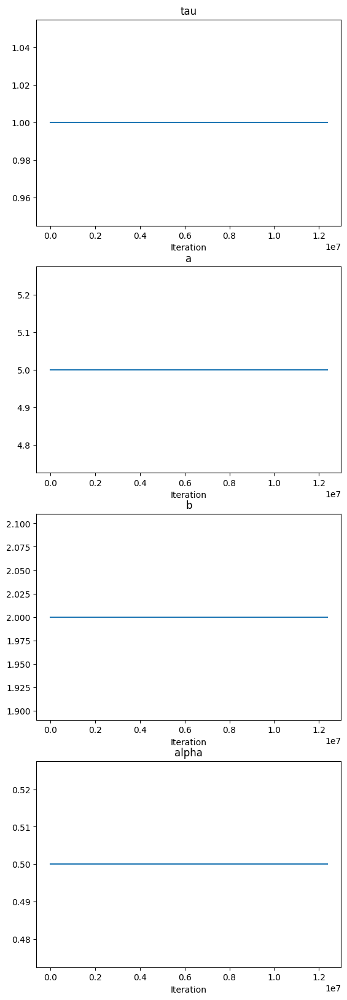

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),
    ("alpha", curriculum.constant_scheduler(alpha))

    ]
)
curriculum.plot_all_schedules()

In [ ]:
curriculum.get_params(99*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0, 'alpha': 0.5}

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_batched,
    curriculum= curriculum,
)

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 12.36it/s]

torch.Size([10000, 5])
{'X': {'mean': tensor(0.4997), 'variance': tensor(0.0834), 'min': tensor(1.2517e-06), 'max': tensor(1.0000)}, 'y': {'mean': tensor(1.2208), 'variance': tensor(1.2544), 'min': tensor(-16.7901), 'max': tensor(24.4622)}, 'beta': {'mean': tensor([0.4867, 0.4829, 0.4961, 0.4845, 0.4911]), 'variance': tensor([0.4557, 0.4548, 0.4938, 0.4636, 0.4688]), 'min': tensor([3.5507e-09, 1.4479e-09, 7.0436e-08, 7.3117e-08, 6.3978e-07]), 'max': tensor([4.8542, 6.0452, 5.5679, 6.3432, 5.9385])}}
Statistics for sigma_squared:
Mean: tensor([0.5057])
Variance: tensor([0.1081])
Min: tensor([0.1244])
Max: tensor([6.7939])


Statistics for time:
Mean: 0.5063642641296611
Variance: 0.08350883963090784
Min: 0.001242220401763916
Max: 0.9999189972877502


Statistics for base_sample_beta:
Mean: tensor([ 0.0050, -0.0027, -0.0056, -0.0283,  0.0079])
Variance: tensor([0.9834, 1.0203, 0.9816, 0.9885, 1.0062])
Min: tensor([-3.4456, -3.4262, -3.7990, -3.4441, -4.0073])
Max: tensor([3.4855, 3.7983, 3

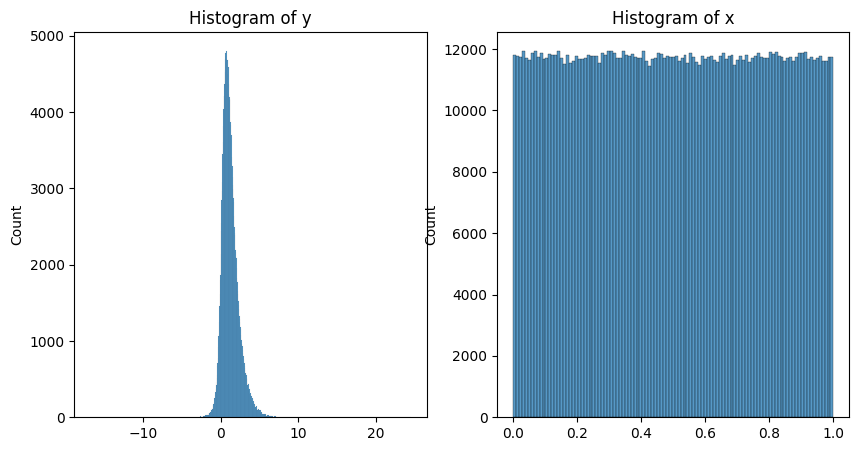

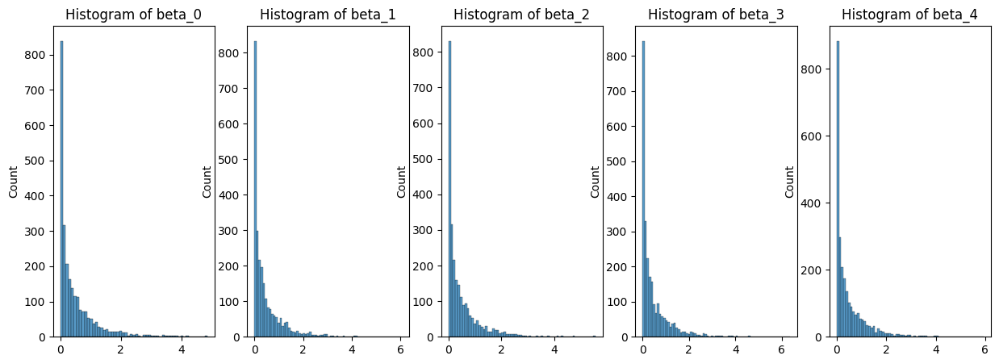

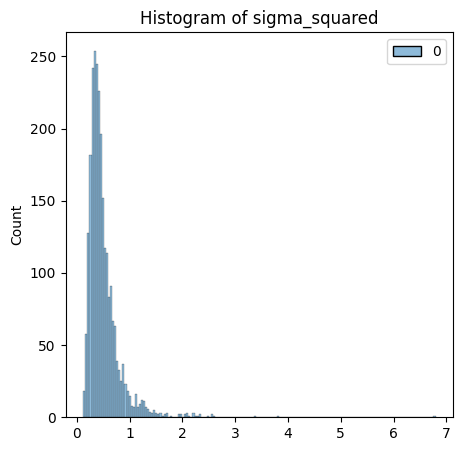

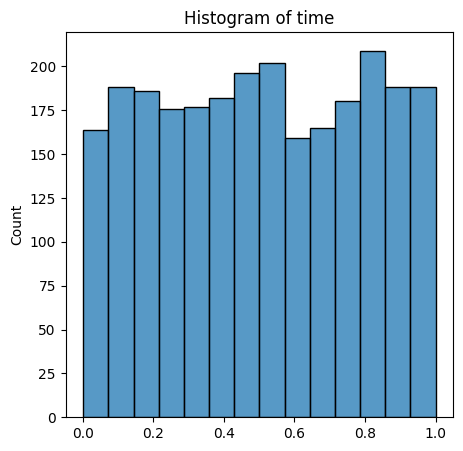

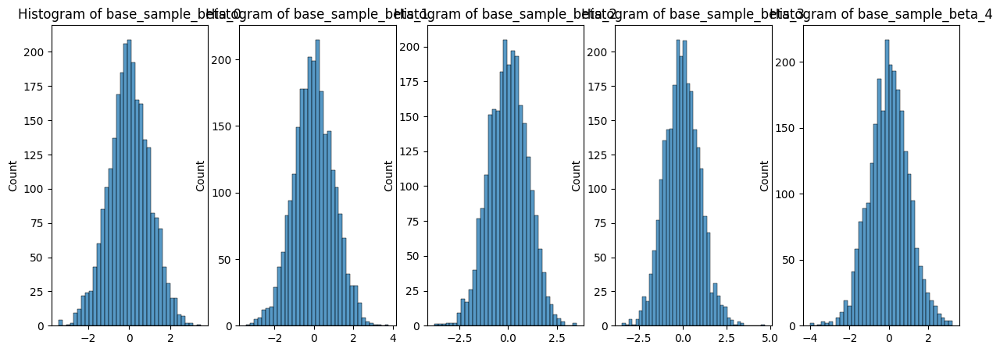

####################################################################################################
Epoch 49


100%|██████████| 10/10 [00:00<00:00, 74.30it/s]

torch.Size([10000, 5])
{'X': {'mean': tensor(0.5000), 'variance': tensor(0.0834), 'min': tensor(7.1526e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(1.2583), 'variance': tensor(1.3184), 'min': tensor(-14.7059), 'max': tensor(21.1652)}, 'beta': {'mean': tensor([0.5092, 0.5073, 0.5025, 0.4869, 0.5103]), 'variance': tensor([0.5104, 0.5037, 0.5328, 0.4758, 0.5651]), 'min': tensor([9.3247e-08, 2.8517e-07, 3.2458e-08, 1.3171e-07, 1.6477e-09]), 'max': tensor([7.8669, 5.8586, 9.2066, 7.2891, 8.0655])}}
Statistics for sigma_squared:
Mean: tensor([0.4976])
Variance: tensor([0.0916])
Min: tensor([0.1118])
Max: tensor([6.9450])


Statistics for time:
Mean: 0.5027999493991956
Variance: 0.08283527499911626
Min: 0.0013219714164733887
Max: 0.9996495246887207


Statistics for base_sample_beta:
Mean: tensor([ 0.0220,  0.0416, -0.0307,  0.0352, -0.0012])
Variance: tensor([0.9860, 1.0067, 0.9760, 1.0315, 1.0548])
Min: tensor([-3.6036, -3.4788, -3.3137, -3.2532, -3.6265])
Max: tensor([3.3265, 3.7299, 

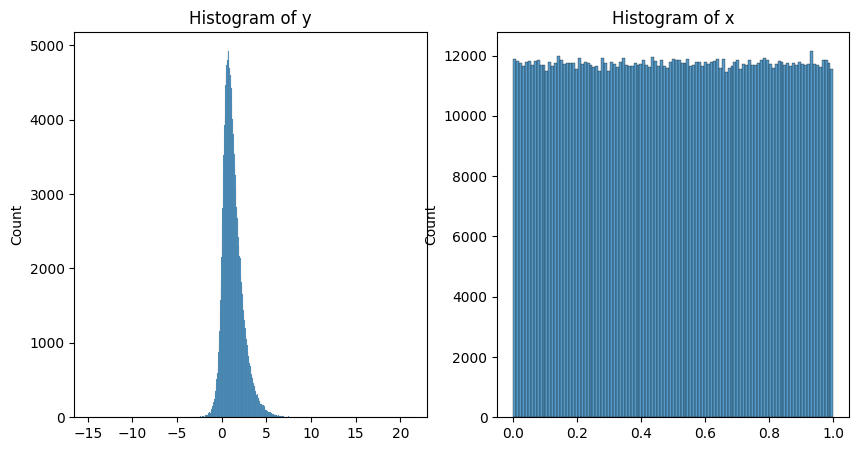

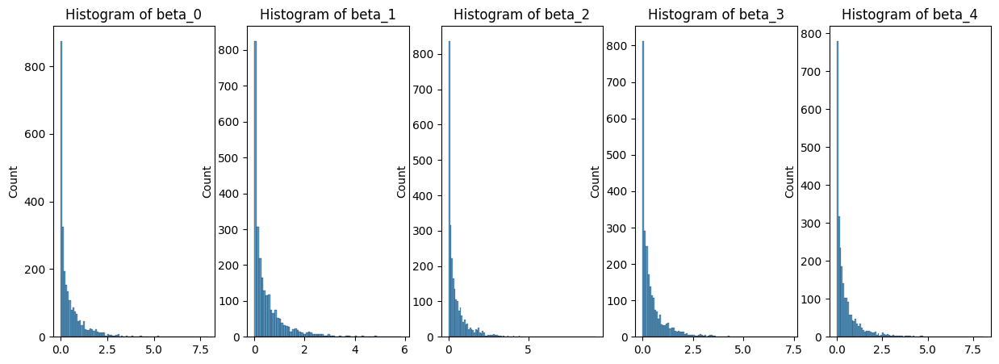

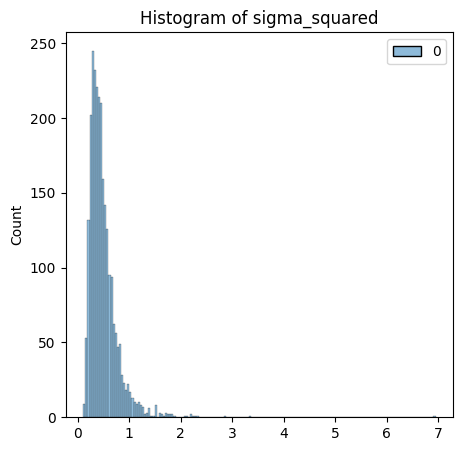

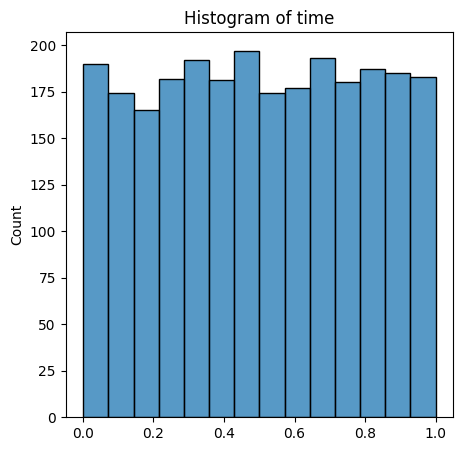

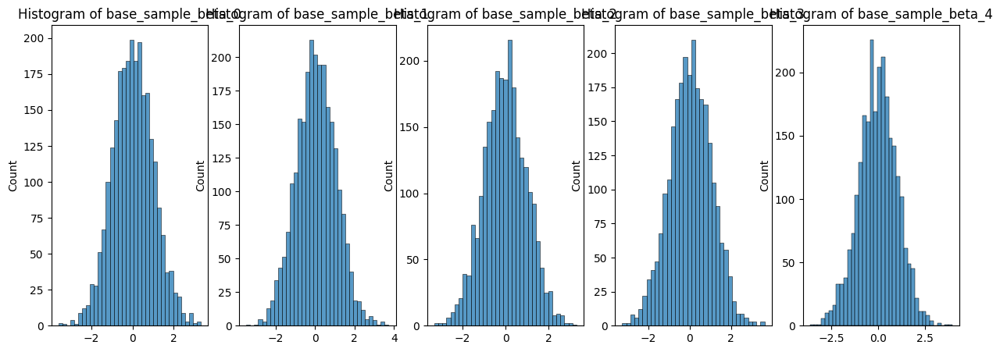

[{'X': {'mean': tensor(0.4997),
   'variance': tensor(0.0834),
   'min': tensor(1.2517e-06),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(1.2208),
   'variance': tensor(1.2544),
   'min': tensor(-16.7901),
   'max': tensor(24.4622)},
  'beta': {'mean': tensor([0.4867, 0.4829, 0.4961, 0.4845, 0.4911]),
   'variance': tensor([0.4557, 0.4548, 0.4938, 0.4636, 0.4688]),
   'min': tensor([3.5507e-09, 1.4479e-09, 7.0436e-08, 7.3117e-08, 6.3978e-07]),
   'max': tensor([4.8542, 6.0452, 5.5679, 6.3432, 5.9385])}},
 {'X': {'mean': tensor(0.5000),
   'variance': tensor(0.0834),
   'min': tensor(7.1526e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(1.2583),
   'variance': tensor(1.3184),
   'min': tensor(-14.7059),
   'max': tensor(21.1652)},
  'beta': {'mean': tensor([0.5092, 0.5073, 0.5025, 0.4869, 0.5103]),
   'variance': tensor([0.5104, 0.5037, 0.5328, 0.4758, 0.5651]),
   'min': tensor([9.3247e-08, 2.8517e-07, 3.2458e-08, 1.3171e-07, 1.6477e-09]),
   'max': tensor([7.8669, 5.8586

In [ ]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

torch.Size([1, 10])
(1, 10)


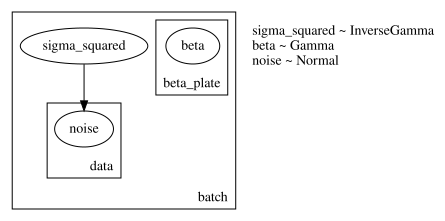

In [ ]:
data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 24985600 and 12492800 respectively


In [ ]:
#save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [ ]:
model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 384,
    n_heads= 6,
    dim_feedforward=384*2,
    dropout_rate = 0.1,
    n_layers=7,
    n_skip_layers_final_heads = 3,
    n_output_units_per_head=[P, P*P, P]
)

encoder_to_process_encoder_output = torch.nn.TransformerEncoder(
    torch.nn.TransformerEncoderLayer(d_model=encoder.d_model,
                                     nhead=encoder.n_heads,
                                     dim_feedforward = encoder.dim_feedforward,
                                     batch_first = True,
                                     norm_first = True),
    num_layers=4)


#encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples


mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)

model_to_process_encoder_output_for_decoder = TransformerPlusNLP(
    transformer_encoder = encoder_to_process_encoder_output,
    mlp = mlp_to_process_encoder_output
)


mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 4,
    d_ff = 512,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 4,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 512,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
    encoder = encoder,
    model_posterior = model_posterior,
    model_to_process_encoder_output = model_to_process_encoder_output_for_decoder,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)




/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'5.31e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-4
opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.5,
    NLL_Loss_function= nll_loss,
    sigma_min=1e-2,
    return_sub_losses=True
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor= 1e3)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0,
    stop_gradients_from_FM_to_encoder = True,
    coupling = None
)

In [ ]:
#trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_23_19_03_15")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_26_16_01_27'

In [ ]:
try:
  trainer.load_best_model()
except Exception as e:
  print("Could not load model")
  print(e)
  pass

Could not load model
[Errno 2] No such file or directory: '/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_26_16_01_27/model.pth'


In [ ]:
trainer.validate()

100%|██████████| 49/49 [00:12<00:00,  3.89it/s]


{'loss_mean': 7.539210319519043,
 'loss_median': 7.518238067626953,
 'loss_std': 0.26669010519981384,
 'loss_FM_mean': 2.562154531478882,
 'loss_FM_median': 2.489231824874878,
 'loss_FM_std': 0.5006054043769836,
 'loss_NLL_mean': 12.516266822814941,
 'loss_NLL_median': 12.517602920532227,
 'loss_NLL_std': 0.14695443212985992}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'alpha': 0.5} at iteration 0


  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 0:
Training: {'loss_mean': 8.631468772888184, 'loss_median': 8.54718017578125, 'loss_std': 0.638817548751831, 'loss_FM_mean': 4.332629680633545, 'loss_FM_median': 4.292623043060303, 'loss_FM_std': 0.3288102149963379, 'loss_NLL_mean': 12.930306434631348, 'loss_NLL_median': 12.89355754852295, 'loss_NLL_std': 1.362471342086792}
Validation: {'loss_mean': 6.819006443023682, 'loss_median': 6.737859725952148, 'loss_std': 0.6294997334480286, 'loss_FM_mean': 4.461083889007568, 'loss_FM_median': 4.24048376083374, 'loss_FM_std': 1.188977837562561, 'loss_NLL_mean': 9.176928520202637, 'loss_NLL_median': 9.19148063659668, 'loss_NLL_std': 0.23188479244709015}
Validation curriculum: {'loss_mean': 6.8551344871521, 'loss_median': 6.717864036560059, 'loss_std': 0.7354376912117004, 'loss_FM_mean': 4.492026329040527, 'loss_FM_median': 4.220386505126953, 'loss_FM_std': 1.3613090515136719, 'loss_NLL_mean': 9.218242645263672, 'loss_NLL_median': 9.21927547454834, 'loss_NLL_std': 0.21767225861549377}
Time

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 1:
Training: {'loss_mean': 7.250083923339844, 'loss_median': 7.352463722229004, 'loss_std': 0.5705358982086182, 'loss_FM_mean': 6.229574203491211, 'loss_FM_median': 6.147469520568848, 'loss_FM_std': 1.064888596534729, 'loss_NLL_mean': 8.270593643188477, 'loss_NLL_median': 8.224178314208984, 'loss_NLL_std': 1.4857760667800903}
Validation: {'loss_mean': 7.473194122314453, 'loss_median': 7.251204967498779, 'loss_std': 1.1794466972351074, 'loss_FM_mean': 8.849252700805664, 'loss_FM_median': 8.553253173828125, 'loss_FM_std': 2.2596187591552734, 'loss_NLL_mean': 6.097136974334717, 'loss_NLL_median': 6.125057220458984, 'loss_NLL_std': 0.27350500226020813}
Validation curriculum: {'loss_mean': 6.991363525390625, 'loss_median': 7.104473114013672, 'loss_std': 0.8129229545593262, 'loss_FM_mean': 7.9685845375061035, 'loss_FM_median': 7.933037757873535, 'loss_FM_std': 1.5598030090332031, 'loss_NLL_mean': 6.0141425132751465, 'loss_NLL_median': 5.985385417938232, 'loss_NLL_std': 0.22953994572162

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 2:
Training: {'loss_mean': 5.434974670410156, 'loss_median': 5.460906028747559, 'loss_std': 0.9594857692718506, 'loss_FM_mean': 6.905384540557861, 'loss_FM_median': 6.7898406982421875, 'loss_FM_std': 1.2101454734802246, 'loss_NLL_mean': 3.964564323425293, 'loss_NLL_median': 3.97760009765625, 'loss_NLL_std': 1.1869573593139648}
Validation: {'loss_mean': 5.365426063537598, 'loss_median': 5.422092437744141, 'loss_std': 1.14444899559021, 'loss_FM_mean': 9.861236572265625, 'loss_FM_median': 9.772299766540527, 'loss_FM_std': 2.155698537826538, 'loss_NLL_mean': 0.8696161508560181, 'loss_NLL_median': 0.8765616416931152, 'loss_NLL_std': 0.21502287685871124}
Validation curriculum: {'loss_mean': 5.218461036682129, 'loss_median': 5.070606708526611, 'loss_std': 1.2293305397033691, 'loss_FM_mean': 9.54389762878418, 'loss_FM_median': 9.315838813781738, 'loss_FM_std': 2.3002209663391113, 'loss_NLL_mean': 0.8930249810218811, 'loss_NLL_median': 0.8827821016311646, 'loss_NLL_std': 0.240428462624549

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 3:
Training: {'loss_mean': 3.9498705863952637, 'loss_median': 3.7992568016052246, 'loss_std': 0.952194094657898, 'loss_FM_mean': 6.13685941696167, 'loss_FM_median': 5.93220853805542, 'loss_FM_std': 1.334736943244934, 'loss_NLL_mean': 1.7628819942474365, 'loss_NLL_median': 1.5447373390197754, 'loss_NLL_std': 1.1234266757965088}
Validation: {'loss_mean': 5.09432315826416, 'loss_median': 5.036623001098633, 'loss_std': 1.177750587463379, 'loss_FM_mean': 5.679814338684082, 'loss_FM_median': 5.359344005584717, 'loss_FM_std': 2.244755268096924, 'loss_NLL_mean': 4.508831024169922, 'loss_NLL_median': 4.5265374183654785, 'loss_NLL_std': 0.23080603778362274}
Validation curriculum: {'loss_mean': 5.096518516540527, 'loss_median': 5.105716228485107, 'loss_std': 1.1797206401824951, 'loss_FM_mean': 5.624131202697754, 'loss_FM_median': 5.249505519866943, 'loss_FM_std': 2.17993426322937, 'loss_NLL_mean': 4.568906307220459, 'loss_NLL_median': 4.540534973144531, 'loss_NLL_std': 0.3437880575656891}
T

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 4:
Training: {'loss_mean': 3.3287181854248047, 'loss_median': 3.2618331909179688, 'loss_std': 0.8570951819419861, 'loss_FM_mean': 5.854681491851807, 'loss_FM_median': 5.673067092895508, 'loss_FM_std': 1.3264753818511963, 'loss_NLL_mean': 0.8027547597885132, 'loss_NLL_median': 0.5601353049278259, 'loss_NLL_std': 0.9403714537620544}
Validation: {'loss_mean': 2.9243781566619873, 'loss_median': 2.6128015518188477, 'loss_std': 1.914775013923645, 'loss_FM_mean': 7.3017473220825195, 'loss_FM_median': 6.485835552215576, 'loss_FM_std': 3.7181077003479004, 'loss_NLL_mean': -1.4529918432235718, 'loss_NLL_median': -1.4852519035339355, 'loss_NLL_std': 0.23515550792217255}
Validation curriculum: {'loss_mean': 2.9645628929138184, 'loss_median': 2.615027904510498, 'loss_std': 1.3277442455291748, 'loss_FM_mean': 7.420608997344971, 'loss_FM_median': 6.5986833572387695, 'loss_FM_std': 2.554537296295166, 'loss_NLL_mean': -1.4914827346801758, 'loss_NLL_median': -1.550464391708374, 'loss_NLL_std': 0.2

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 5:
Training: {'loss_mean': 2.6160664558410645, 'loss_median': 2.450659990310669, 'loss_std': 0.8878539204597473, 'loss_FM_mean': 4.90181827545166, 'loss_FM_median': 4.691400527954102, 'loss_FM_std': 1.2960175275802612, 'loss_NLL_mean': 0.33031442761421204, 'loss_NLL_median': 0.03891474008560181, 'loss_NLL_std': 0.98225337266922}
Validation: {'loss_mean': 1.6049776077270508, 'loss_median': 1.4985238313674927, 'loss_std': 1.022165298461914, 'loss_FM_mean': 4.840561866760254, 'loss_FM_median': 4.700010776519775, 'loss_FM_std': 1.9411697387695312, 'loss_NLL_mean': -1.6306064128875732, 'loss_NLL_median': -1.6632778644561768, 'loss_NLL_std': 0.16026103496551514}
Validation curriculum: {'loss_mean': 1.4967306852340698, 'loss_median': 1.3039101362228394, 'loss_std': 1.2403641939163208, 'loss_FM_mean': 4.620211601257324, 'loss_FM_median': 4.036930084228516, 'loss_FM_std': 2.3874948024749756, 'loss_NLL_mean': -1.6267505884170532, 'loss_NLL_median': -1.6330819129943848, 'loss_NLL_std': 0.16

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 6:
Training: {'loss_mean': 1.7348910570144653, 'loss_median': 1.562520980834961, 'loss_std': 0.8591540455818176, 'loss_FM_mean': 3.8178324699401855, 'loss_FM_median': 3.5516533851623535, 'loss_FM_std': 1.2694978713989258, 'loss_NLL_mean': -0.34805044531822205, 'loss_NLL_median': -0.5994569063186646, 'loss_NLL_std': 0.9215049743652344}
Validation: {'loss_mean': 2.041328191757202, 'loss_median': 1.8623909950256348, 'loss_std': 0.8672248125076294, 'loss_FM_mean': 3.7547709941864014, 'loss_FM_median': 3.420031785964966, 'loss_FM_std': 1.6680214405059814, 'loss_NLL_mean': 0.3278856575489044, 'loss_NLL_median': 0.31681200861930847, 'loss_NLL_std': 0.17946568131446838}
Validation curriculum: {'loss_mean': 1.840912938117981, 'loss_median': 1.7012670040130615, 'loss_std': 0.79383385181427, 'loss_FM_mean': 3.3887431621551514, 'loss_FM_median': 3.271627426147461, 'loss_FM_std': 1.4848027229309082, 'loss_NLL_mean': 0.2930826246738434, 'loss_NLL_median': 0.27977433800697327, 'loss_NLL_std': 0

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 7:
Training: {'loss_mean': 1.4998167753219604, 'loss_median': 1.354968786239624, 'loss_std': 0.7682030200958252, 'loss_FM_mean': 3.2705976963043213, 'loss_FM_median': 3.0873639583587646, 'loss_FM_std': 0.9925951361656189, 'loss_NLL_mean': -0.2709636986255646, 'loss_NLL_median': -0.5527031421661377, 'loss_NLL_std': 1.0151972770690918}
Validation: {'loss_mean': 5.010899543762207, 'loss_median': 2.1540017127990723, 'loss_std': 6.343587398529053, 'loss_FM_mean': 10.834207534790039, 'loss_FM_median': 5.201931476593018, 'loss_FM_std': 12.674967765808105, 'loss_NLL_mean': -0.8124069571495056, 'loss_NLL_median': -0.8186575174331665, 'loss_NLL_std': 0.1748809814453125}
Validation curriculum: {'loss_mean': 2.9430198669433594, 'loss_median': 2.011289119720459, 'loss_std': 3.5021088123321533, 'loss_FM_mean': 6.731907367706299, 'loss_FM_median': 4.9963579177856445, 'loss_FM_std': 7.020986557006836, 'loss_NLL_mean': -0.8458672165870667, 'loss_NLL_median': -0.8375908732414246, 'loss_NLL_std': 0

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.20it/s]


Epoch 8:
Training: {'loss_mean': 0.842529296875, 'loss_median': 0.6718664169311523, 'loss_std': 0.7238331437110901, 'loss_FM_mean': 2.8507580757141113, 'loss_FM_median': 2.5016791820526123, 'loss_FM_std': 1.2004681825637817, 'loss_NLL_mean': -1.1656994819641113, 'loss_NLL_median': -1.320833444595337, 'loss_NLL_std': 0.6889795660972595}
Validation: {'loss_mean': 0.19017218053340912, 'loss_median': -0.05069190263748169, 'loss_std': 0.9132795929908752, 'loss_FM_mean': 2.4610674381256104, 'loss_FM_median': 1.8514293432235718, 'loss_FM_std': 1.8136589527130127, 'loss_NLL_mean': -2.0807230472564697, 'loss_NLL_median': -2.104580879211426, 'loss_NLL_std': 0.17458222806453705}
Validation curriculum: {'loss_mean': 0.11245357990264893, 'loss_median': -0.1484871506690979, 'loss_std': 0.7142179608345032, 'loss_FM_mean': 2.3254058361053467, 'loss_FM_median': 1.832742691040039, 'loss_FM_std': 1.3894731998443604, 'loss_NLL_mean': -2.100498914718628, 'loss_NLL_median': -2.095989227294922, 'loss_NLL_std

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 9:
Training: {'loss_mean': 0.4255979359149933, 'loss_median': 0.2626227140426636, 'loss_std': 0.7870044708251953, 'loss_FM_mean': 2.303316354751587, 'loss_FM_median': 1.956003189086914, 'loss_FM_std': 1.0717498064041138, 'loss_NLL_mean': -1.4521204233169556, 'loss_NLL_median': -1.6071689128875732, 'loss_NLL_std': 0.9748631119728088}
Validation: {'loss_mean': -0.6013008952140808, 'loss_median': -0.7829559445381165, 'loss_std': 0.7387245893478394, 'loss_FM_mean': 2.025264263153076, 'loss_FM_median': 1.5454281568527222, 'loss_FM_std': 1.4360229969024658, 'loss_NLL_mean': -3.2278659343719482, 'loss_NLL_median': -3.2289371490478516, 'loss_NLL_std': 0.14869973063468933}
Validation curriculum: {'loss_mean': -0.8279685378074646, 'loss_median': -0.9221418499946594, 'loss_std': 0.5432419776916504, 'loss_FM_mean': 1.55645751953125, 'loss_FM_median': 1.3401037454605103, 'loss_FM_std': 0.9933837652206421, 'loss_NLL_mean': -3.2123944759368896, 'loss_NLL_median': -3.2160773277282715, 'loss_NLL_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.27it/s]


Epoch 10:
Training: {'loss_mean': -0.14620018005371094, 'loss_median': -0.33150315284729004, 'loss_std': 1.0444533824920654, 'loss_FM_mean': 2.0265157222747803, 'loss_FM_median': 1.7943350076675415, 'loss_FM_std': 1.0830122232437134, 'loss_NLL_mean': -2.318916082382202, 'loss_NLL_median': -2.568249225616455, 'loss_NLL_std': 1.3176556825637817}
Validation: {'loss_mean': -0.20352192223072052, 'loss_median': -0.57075035572052, 'loss_std': 1.2808443307876587, 'loss_FM_mean': 3.535290241241455, 'loss_FM_median': 2.803302049636841, 'loss_FM_std': 2.555387258529663, 'loss_NLL_mean': -3.942333936691284, 'loss_NLL_median': -3.969642162322998, 'loss_NLL_std': 0.14881311357021332}
Validation curriculum: {'loss_mean': -0.17858681082725525, 'loss_median': -0.37525832653045654, 'loss_std': 1.2970267534255981, 'loss_FM_mean': 3.5761892795562744, 'loss_FM_median': 3.040818929672241, 'loss_FM_std': 2.519322395324707, 'loss_NLL_mean': -3.9333627223968506, 'loss_NLL_median': -3.925781488418579, 'loss_NLL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 11:
Training: {'loss_mean': -0.4920786917209625, 'loss_median': -0.7453103065490723, 'loss_std': 0.9929590225219727, 'loss_FM_mean': 1.8667395114898682, 'loss_FM_median': 1.4930540323257446, 'loss_FM_std': 1.2810643911361694, 'loss_NLL_mean': -2.8508968353271484, 'loss_NLL_median': -3.0525264739990234, 'loss_NLL_std': 1.0712854862213135}
Validation: {'loss_mean': -1.2644436359405518, 'loss_median': -1.3568153381347656, 'loss_std': 0.39719295501708984, 'loss_FM_mean': 1.4041255712509155, 'loss_FM_median': 1.2461901903152466, 'loss_FM_std': 0.7581473588943481, 'loss_NLL_mean': -3.9330132007598877, 'loss_NLL_median': -3.9545035362243652, 'loss_NLL_std': 0.14575761556625366}
Validation curriculum: {'loss_mean': -1.3085062503814697, 'loss_median': -1.330115795135498, 'loss_std': 0.3340364694595337, 'loss_FM_mean': 1.3018606901168823, 'loss_FM_median': 1.263731598854065, 'loss_FM_std': 0.5951321125030518, 'loss_NLL_mean': -3.9188730716705322, 'loss_NLL_median': -3.941964626312256, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.19it/s]


Epoch 12:
Training: {'loss_mean': -0.8372870087623596, 'loss_median': -0.97476726770401, 'loss_std': 0.5665313601493835, 'loss_FM_mean': 1.486259937286377, 'loss_FM_median': 1.2883955240249634, 'loss_FM_std': 0.7523138523101807, 'loss_NLL_mean': -3.1608335971832275, 'loss_NLL_median': -3.371129035949707, 'loss_NLL_std': 0.813953697681427}
Validation: {'loss_mean': 4.5433244705200195, 'loss_median': 2.844526529312134, 'loss_std': 5.046509742736816, 'loss_FM_mean': 13.419898986816406, 'loss_FM_median': 9.859959602355957, 'loss_FM_std': 10.056918144226074, 'loss_NLL_mean': -4.333251476287842, 'loss_NLL_median': -4.335282325744629, 'loss_NLL_std': 0.15304483473300934}
Validation curriculum: {'loss_mean': 4.433382511138916, 'loss_median': 4.106196880340576, 'loss_std': 4.206125736236572, 'loss_FM_mean': 13.218636512756348, 'loss_FM_median': 12.78450870513916, 'loss_FM_std': 8.371877670288086, 'loss_NLL_mean': -4.351871490478516, 'loss_NLL_median': -4.363735198974609, 'loss_NLL_std': 0.16922

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 13:
Training: {'loss_mean': -1.1264679431915283, 'loss_median': -1.2238497734069824, 'loss_std': 0.4380016624927521, 'loss_FM_mean': 1.2789669036865234, 'loss_FM_median': 1.1209454536437988, 'loss_FM_std': 0.616370677947998, 'loss_NLL_mean': -3.531902313232422, 'loss_NLL_median': -3.6568832397460938, 'loss_NLL_std': 0.6063730120658875}
Validation: {'loss_mean': -1.6475658416748047, 'loss_median': -1.844093680381775, 'loss_std': 0.6343158483505249, 'loss_FM_mean': 0.7675465941429138, 'loss_FM_median': 0.3439507484436035, 'loss_FM_std': 1.210693597793579, 'loss_NLL_mean': -4.062678337097168, 'loss_NLL_median': -4.099346160888672, 'loss_NLL_std': 0.1941804736852646}
Validation curriculum: {'loss_mean': -1.6772897243499756, 'loss_median': -1.790151596069336, 'loss_std': 0.6897451877593994, 'loss_FM_mean': 0.7178270816802979, 'loss_FM_median': 0.44995880126953125, 'loss_FM_std': 1.3654123544692993, 'loss_NLL_mean': -4.072406768798828, 'loss_NLL_median': -4.049984455108643, 'loss_NLL_s

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 14:
Training: {'loss_mean': -1.3688181638717651, 'loss_median': -1.4432218074798584, 'loss_std': 0.3267227113246918, 'loss_FM_mean': 0.9197846055030823, 'loss_FM_median': 0.8438146710395813, 'loss_FM_std': 0.3169457018375397, 'loss_NLL_mean': -3.657421350479126, 'loss_NLL_median': -3.8007051944732666, 'loss_NLL_std': 0.5411941409111023}
Validation: {'loss_mean': -1.1482685804367065, 'loss_median': -1.312798023223877, 'loss_std': 1.0430775880813599, 'loss_FM_mean': 2.5247764587402344, 'loss_FM_median': 2.09911847114563, 'loss_FM_std': 2.047983407974243, 'loss_NLL_mean': -4.821313381195068, 'loss_NLL_median': -4.804723739624023, 'loss_NLL_std': 0.1811225712299347}
Validation curriculum: {'loss_mean': -1.0634183883666992, 'loss_median': -1.3137649297714233, 'loss_std': 0.934668779373169, 'loss_FM_mean': 2.659435272216797, 'loss_FM_median': 2.2564499378204346, 'loss_FM_std': 1.7956159114837646, 'loss_NLL_mean': -4.786271572113037, 'loss_NLL_median': -4.803253173828125, 'loss_NLL_std'

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 15:
Training: {'loss_mean': -1.4546706676483154, 'loss_median': -1.5787899494171143, 'loss_std': 0.51773601770401, 'loss_FM_mean': 0.7804301381111145, 'loss_FM_median': 0.7249558568000793, 'loss_FM_std': 0.2348528504371643, 'loss_NLL_mean': -3.6897714138031006, 'loss_NLL_median': -3.9335930347442627, 'loss_NLL_std': 0.9562253355979919}
Validation: {'loss_mean': -1.766038179397583, 'loss_median': -1.7878707647323608, 'loss_std': 0.2803330421447754, 'loss_FM_mean': 0.7765910029411316, 'loss_FM_median': 0.6961327791213989, 'loss_FM_std': 0.5178179740905762, 'loss_NLL_mean': -4.308667182922363, 'loss_NLL_median': -4.304726600646973, 'loss_NLL_std': 0.15397414565086365}
Validation curriculum: {'loss_mean': -1.6396303176879883, 'loss_median': -1.7997212409973145, 'loss_std': 0.5324200987815857, 'loss_FM_mean': 0.9918606281280518, 'loss_FM_median': 0.6306542754173279, 'loss_FM_std': 1.0008991956710815, 'loss_NLL_mean': -4.271121025085449, 'loss_NLL_median': -4.274580478668213, 'loss_NLL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 16:
Training: {'loss_mean': -1.613793134689331, 'loss_median': -1.718435525894165, 'loss_std': 0.42522573471069336, 'loss_FM_mean': 0.6962091326713562, 'loss_FM_median': 0.6613940596580505, 'loss_FM_std': 0.2042144238948822, 'loss_NLL_mean': -3.923795461654663, 'loss_NLL_median': -4.130740165710449, 'loss_NLL_std': 0.8082842826843262}
Validation: {'loss_mean': -1.6311066150665283, 'loss_median': -1.603589653968811, 'loss_std': 0.21525728702545166, 'loss_FM_mean': 0.8907027244567871, 'loss_FM_median': 0.86601322889328, 'loss_FM_std': 0.3446553349494934, 'loss_NLL_mean': -4.152915954589844, 'loss_NLL_median': -4.170115947723389, 'loss_NLL_std': 0.1748025119304657}
Validation curriculum: {'loss_mean': -1.63536536693573, 'loss_median': -1.7148611545562744, 'loss_std': 0.29115772247314453, 'loss_FM_mean': 0.9151212573051453, 'loss_FM_median': 0.8209416270256042, 'loss_FM_std': 0.4846867322921753, 'loss_NLL_mean': -4.18585205078125, 'loss_NLL_median': -4.192351341247559, 'loss_NLL_std'

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 17:
Training: {'loss_mean': -1.6817810535430908, 'loss_median': -1.821364164352417, 'loss_std': 0.4976830780506134, 'loss_FM_mean': 0.6062290668487549, 'loss_FM_median': 0.5597617030143738, 'loss_FM_std': 0.18234500288963318, 'loss_NLL_mean': -3.9697916507720947, 'loss_NLL_median': -4.208893775939941, 'loss_NLL_std': 0.911083996295929}
Validation: {'loss_mean': -2.081875801086426, 'loss_median': -2.120032787322998, 'loss_std': 0.19039468467235565, 'loss_FM_mean': 0.4495488703250885, 'loss_FM_median': 0.3822785019874573, 'loss_FM_std': 0.3647915720939636, 'loss_NLL_mean': -4.613300323486328, 'loss_NLL_median': -4.628181457519531, 'loss_NLL_std': 0.15277647972106934}
Validation curriculum: {'loss_mean': -2.0750508308410645, 'loss_median': -2.154449939727783, 'loss_std': 0.2096962332725525, 'loss_FM_mean': 0.4490075707435608, 'loss_FM_median': 0.31430497765541077, 'loss_FM_std': 0.3232882022857666, 'loss_NLL_mean': -4.599108695983887, 'loss_NLL_median': -4.611774921417236, 'loss_NLL

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 18:
Training: {'loss_mean': -1.8480859994888306, 'loss_median': -1.9176757335662842, 'loss_std': 0.3561807870864868, 'loss_FM_mean': 0.5473023056983948, 'loss_FM_median': 0.5227266550064087, 'loss_FM_std': 0.15373124182224274, 'loss_NLL_mean': -4.243474006652832, 'loss_NLL_median': -4.372458457946777, 'loss_NLL_std': 0.6574237942695618}
Validation: {'loss_mean': -2.3144571781158447, 'loss_median': -2.3160054683685303, 'loss_std': 0.09272872656583786, 'loss_FM_mean': 0.19444946944713593, 'loss_FM_median': 0.19747373461723328, 'loss_FM_std': 0.05053834617137909, 'loss_NLL_mean': -4.823363780975342, 'loss_NLL_median': -4.818914413452148, 'loss_NLL_std': 0.16342690587043762}
Validation curriculum: {'loss_mean': -2.3244500160217285, 'loss_median': -2.334587335586548, 'loss_std': 0.09818373620510101, 'loss_FM_mean': 0.21363651752471924, 'loss_FM_median': 0.20001272857189178, 'loss_FM_std': 0.06975097954273224, 'loss_NLL_mean': -4.862536430358887, 'loss_NLL_median': -4.848847389221191, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 19:
Training: {'loss_mean': -1.9890879392623901, 'loss_median': -2.032543659210205, 'loss_std': 0.22587595880031586, 'loss_FM_mean': 0.4915075898170471, 'loss_FM_median': 0.46832773089408875, 'loss_FM_std': 0.11703335493803024, 'loss_NLL_mean': -4.4696831703186035, 'loss_NLL_median': -4.548532485961914, 'loss_NLL_std': 0.4250071942806244}
Validation: {'loss_mean': -2.4293336868286133, 'loss_median': -2.4317500591278076, 'loss_std': 0.09718537330627441, 'loss_FM_mean': 0.2546229660511017, 'loss_FM_median': 0.2285124510526657, 'loss_FM_std': 0.09626924246549606, 'loss_NLL_mean': -5.113290786743164, 'loss_NLL_median': -5.109618186950684, 'loss_NLL_std': 0.1304914951324463}
Validation curriculum: {'loss_mean': -2.4347710609436035, 'loss_median': -2.43233060836792, 'loss_std': 0.12855252623558044, 'loss_FM_mean': 0.24703317880630493, 'loss_FM_median': 0.22500263154506683, 'loss_FM_std': 0.09894920885562897, 'loss_NLL_mean': -5.116575241088867, 'loss_NLL_median': -5.144802570343018, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 20:
Training: {'loss_mean': -2.007901668548584, 'loss_median': -2.0803864002227783, 'loss_std': 0.3432091176509857, 'loss_FM_mean': 0.49094897508621216, 'loss_FM_median': 0.46477460861206055, 'loss_FM_std': 0.12508106231689453, 'loss_NLL_mean': -4.506752014160156, 'loss_NLL_median': -4.63810920715332, 'loss_NLL_std': 0.6573401689529419}
Validation: {'loss_mean': -2.791569948196411, 'loss_median': -2.7989559173583984, 'loss_std': 0.10445240885019302, 'loss_FM_mean': 0.19146563112735748, 'loss_FM_median': 0.1816893070936203, 'loss_FM_std': 0.07027731090784073, 'loss_NLL_mean': -5.7746052742004395, 'loss_NLL_median': -5.77658748626709, 'loss_NLL_std': 0.16702800989151}
Validation curriculum: {'loss_mean': -2.811697483062744, 'loss_median': -2.8241331577301025, 'loss_std': 0.08386638760566711, 'loss_FM_mean': 0.1872403472661972, 'loss_FM_median': 0.17985056340694427, 'loss_FM_std': 0.0597674585878849, 'loss_NLL_mean': -5.810635089874268, 'loss_NLL_median': -5.818476676940918, 'loss_N

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 21:
Training: {'loss_mean': -2.025031089782715, 'loss_median': -2.135899543762207, 'loss_std': 0.46202215552330017, 'loss_FM_mean': 0.4787338078022003, 'loss_FM_median': 0.45535334944725037, 'loss_FM_std': 0.11576183140277863, 'loss_NLL_mean': -4.528796195983887, 'loss_NLL_median': -4.7404279708862305, 'loss_NLL_std': 0.8886634111404419}
Validation: {'loss_mean': -2.6070146560668945, 'loss_median': -2.592062473297119, 'loss_std': 0.09556012600660324, 'loss_FM_mean': 0.17615987360477448, 'loss_FM_median': 0.17790745198726654, 'loss_FM_std': 0.039902642369270325, 'loss_NLL_mean': -5.390189170837402, 'loss_NLL_median': -5.3468732833862305, 'loss_NLL_std': 0.17206601798534393}
Validation curriculum: {'loss_mean': -2.602928638458252, 'loss_median': -2.6200127601623535, 'loss_std': 0.08637671172618866, 'loss_FM_mean': 0.17558839917182922, 'loss_FM_median': 0.16812071204185486, 'loss_FM_std': 0.05073561519384384, 'loss_NLL_mean': -5.38144588470459, 'loss_NLL_median': -5.382452487945557,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 22:
Training: {'loss_mean': -2.1386301517486572, 'loss_median': -2.2151761054992676, 'loss_std': 0.34792202711105347, 'loss_FM_mean': 0.44186702370643616, 'loss_FM_median': 0.4269581735134125, 'loss_FM_std': 0.11542966216802597, 'loss_NLL_mean': -4.7191267013549805, 'loss_NLL_median': -4.863583087921143, 'loss_NLL_std': 0.6611994504928589}
Validation: {'loss_mean': -2.671248435974121, 'loss_median': -2.674649238586426, 'loss_std': 0.11379174888134003, 'loss_FM_mean': 0.26960691809654236, 'loss_FM_median': 0.2500559389591217, 'loss_FM_std': 0.08634567260742188, 'loss_NLL_mean': -5.612103462219238, 'loss_NLL_median': -5.609735488891602, 'loss_NLL_std': 0.1777428686618805}
Validation curriculum: {'loss_mean': -2.637218952178955, 'loss_median': -2.65976619720459, 'loss_std': 0.10295549780130386, 'loss_FM_mean': 0.28825825452804565, 'loss_FM_median': 0.28776639699935913, 'loss_FM_std': 0.10101746022701263, 'loss_NLL_mean': -5.5626959800720215, 'loss_NLL_median': -5.558581829071045, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 23:
Training: {'loss_mean': -2.1956446170806885, 'loss_median': -2.2671754360198975, 'loss_std': 0.34163856506347656, 'loss_FM_mean': 0.4281213879585266, 'loss_FM_median': 0.4150077998638153, 'loss_FM_std': 0.10143441706895828, 'loss_NLL_mean': -4.81941032409668, 'loss_NLL_median': -4.946431636810303, 'loss_NLL_std': 0.6567674279212952}
Validation: {'loss_mean': -2.7833027839660645, 'loss_median': -2.7841055393218994, 'loss_std': 0.08145409822463989, 'loss_FM_mean': 0.14215850830078125, 'loss_FM_median': 0.14599762856960297, 'loss_FM_std': 0.033110957592725754, 'loss_NLL_mean': -5.70876407623291, 'loss_NLL_median': -5.699242115020752, 'loss_NLL_std': 0.15228570997714996}
Validation curriculum: {'loss_mean': -2.78989839553833, 'loss_median': -2.8030223846435547, 'loss_std': 0.09374464303255081, 'loss_FM_mean': 0.1351202428340912, 'loss_FM_median': 0.127066507935524, 'loss_FM_std': 0.04280253127217293, 'loss_NLL_mean': -5.714917182922363, 'loss_NLL_median': -5.726022243499756, 'los

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 24:
Training: {'loss_mean': -2.2603414058685303, 'loss_median': -2.303424596786499, 'loss_std': 0.22730913758277893, 'loss_FM_mean': 0.41058477759361267, 'loss_FM_median': 0.3983284533023834, 'loss_FM_std': 0.09783481806516647, 'loss_NLL_mean': -4.931266784667969, 'loss_NLL_median': -5.021032810211182, 'loss_NLL_std': 0.43956080079078674}
Validation: {'loss_mean': -2.938781499862671, 'loss_median': -2.965041160583496, 'loss_std': 0.08611488342285156, 'loss_FM_mean': 0.19099026918411255, 'loss_FM_median': 0.18065336346626282, 'loss_FM_std': 0.06194205582141876, 'loss_NLL_mean': -6.0685529708862305, 'loss_NLL_median': -6.085559844970703, 'loss_NLL_std': 0.13873815536499023}
Validation curriculum: {'loss_mean': -2.9601733684539795, 'loss_median': -2.9590189456939697, 'loss_std': 0.0922984853386879, 'loss_FM_mean': 0.18347740173339844, 'loss_FM_median': 0.17761169373989105, 'loss_FM_std': 0.06294883787631989, 'loss_NLL_mean': -6.103824615478516, 'loss_NLL_median': -6.103606700897217,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.20it/s]


Epoch 25:
Training: {'loss_mean': -2.2838191986083984, 'loss_median': -2.343665838241577, 'loss_std': 0.36999455094337463, 'loss_FM_mean': 0.40567147731781006, 'loss_FM_median': 0.39461034536361694, 'loss_FM_std': 0.09239884465932846, 'loss_NLL_mean': -4.973309516906738, 'loss_NLL_median': -5.111856460571289, 'loss_NLL_std': 0.7126609086990356}
Validation: {'loss_mean': -3.0988054275512695, 'loss_median': -3.099255323410034, 'loss_std': 0.08082019537687302, 'loss_FM_mean': 0.11923006922006607, 'loss_FM_median': 0.11787153780460358, 'loss_FM_std': 0.032631438225507736, 'loss_NLL_mean': -6.316841125488281, 'loss_NLL_median': -6.332601547241211, 'loss_NLL_std': 0.14744918048381805}
Validation curriculum: {'loss_mean': -3.0835914611816406, 'loss_median': -3.0823566913604736, 'loss_std': 0.07497745007276535, 'loss_FM_mean': 0.1281612068414688, 'loss_FM_median': 0.1280968189239502, 'loss_FM_std': 0.032902058213949203, 'loss_NLL_mean': -6.295344352722168, 'loss_NLL_median': -6.275869369506836

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 26:
Training: {'loss_mean': -2.322972059249878, 'loss_median': -2.3827476501464844, 'loss_std': 0.3616304099559784, 'loss_FM_mean': 0.3991014361381531, 'loss_FM_median': 0.38435280323028564, 'loss_FM_std': 0.10524985939264297, 'loss_NLL_mean': -5.045045375823975, 'loss_NLL_median': -5.156711578369141, 'loss_NLL_std': 0.678379237651825}
Validation: {'loss_mean': -2.962120294570923, 'loss_median': -2.9842488765716553, 'loss_std': 0.09279519319534302, 'loss_FM_mean': 0.16069941222667694, 'loss_FM_median': 0.15601764619350433, 'loss_FM_std': 0.05001445114612579, 'loss_NLL_mean': -6.084939956665039, 'loss_NLL_median': -6.116331100463867, 'loss_NLL_std': 0.15650798380374908}
Validation curriculum: {'loss_mean': -2.9590964317321777, 'loss_median': -2.970186471939087, 'loss_std': 0.08806128054857254, 'loss_FM_mean': 0.14966845512390137, 'loss_FM_median': 0.1385481357574463, 'loss_FM_std': 0.043941400945186615, 'loss_NLL_mean': -6.067861080169678, 'loss_NLL_median': -6.10091495513916, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 27:
Training: {'loss_mean': -2.3634912967681885, 'loss_median': -2.4141170978546143, 'loss_std': 0.2437511682510376, 'loss_FM_mean': 0.3807944059371948, 'loss_FM_median': 0.3656081259250641, 'loss_FM_std': 0.10103859752416611, 'loss_NLL_mean': -5.107777118682861, 'loss_NLL_median': -5.2039384841918945, 'loss_NLL_std': 0.4573971927165985}
Validation: {'loss_mean': -3.0407145023345947, 'loss_median': -3.0561304092407227, 'loss_std': 0.08445922285318375, 'loss_FM_mean': 0.14337140321731567, 'loss_FM_median': 0.1344718039035797, 'loss_FM_std': 0.050251543521881104, 'loss_NLL_mean': -6.2248005867004395, 'loss_NLL_median': -6.249225616455078, 'loss_NLL_std': 0.1440761536359787}
Validation curriculum: {'loss_mean': -3.025172233581543, 'loss_median': -3.03296160697937, 'loss_std': 0.08600641787052155, 'loss_FM_mean': 0.16267211735248566, 'loss_FM_median': 0.15763862431049347, 'loss_FM_std': 0.056290362030267715, 'loss_NLL_mean': -6.213016986846924, 'loss_NLL_median': -6.216553211212158, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 28:
Training: {'loss_mean': -2.3757593631744385, 'loss_median': -2.4271109104156494, 'loss_std': 0.2578565776348114, 'loss_FM_mean': 0.37516164779663086, 'loss_FM_median': 0.36668625473976135, 'loss_FM_std': 0.09205405414104462, 'loss_NLL_mean': -5.126680850982666, 'loss_NLL_median': -5.239769458770752, 'loss_NLL_std': 0.4780072271823883}
Validation: {'loss_mean': -3.1823580265045166, 'loss_median': -3.2007315158843994, 'loss_std': 0.10196041315793991, 'loss_FM_mean': 0.1591915339231491, 'loss_FM_median': 0.15035955607891083, 'loss_FM_std': 0.0630374476313591, 'loss_NLL_mean': -6.523907661437988, 'loss_NLL_median': -6.563056945800781, 'loss_NLL_std': 0.1730106920003891}
Validation curriculum: {'loss_mean': -3.164896011352539, 'loss_median': -3.1563165187835693, 'loss_std': 0.07155545055866241, 'loss_FM_mean': 0.1584818810224533, 'loss_FM_median': 0.15010599792003632, 'loss_FM_std': 0.043021053075790405, 'loss_NLL_mean': -6.488273620605469, 'loss_NLL_median': -6.486525535583496, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 29:
Training: {'loss_mean': -2.3919527530670166, 'loss_median': -2.4551494121551514, 'loss_std': 0.3448581397533417, 'loss_FM_mean': 0.3677189350128174, 'loss_FM_median': 0.3528383672237396, 'loss_FM_std': 0.0981474444270134, 'loss_NLL_mean': -5.1516242027282715, 'loss_NLL_median': -5.293600082397461, 'loss_NLL_std': 0.6712117791175842}
Validation: {'loss_mean': -3.1078522205352783, 'loss_median': -3.110055446624756, 'loss_std': 0.08024709671735764, 'loss_FM_mean': 0.14041386544704437, 'loss_FM_median': 0.13880276679992676, 'loss_FM_std': 0.03674233332276344, 'loss_NLL_mean': -6.3561177253723145, 'loss_NLL_median': -6.355402946472168, 'loss_NLL_std': 0.14373531937599182}
Validation curriculum: {'loss_mean': -3.093684196472168, 'loss_median': -3.1071062088012695, 'loss_std': 0.07902538776397705, 'loss_FM_mean': 0.14515744149684906, 'loss_FM_median': 0.14102409780025482, 'loss_FM_std': 0.041639719158411026, 'loss_NLL_mean': -6.332526206970215, 'loss_NLL_median': -6.359832763671875,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 30:
Training: {'loss_mean': -2.375763416290283, 'loss_median': -2.469879388809204, 'loss_std': 0.4791441559791565, 'loss_FM_mean': 0.3666095733642578, 'loss_FM_median': 0.33926859498023987, 'loss_FM_std': 0.11369841545820236, 'loss_NLL_mean': -5.118136405944824, 'loss_NLL_median': -5.282144069671631, 'loss_NLL_std': 0.8921802043914795}
Validation: {'loss_mean': -2.7365121841430664, 'loss_median': -2.7529449462890625, 'loss_std': 0.09685534238815308, 'loss_FM_mean': 0.17447929084300995, 'loss_FM_median': 0.16535982489585876, 'loss_FM_std': 0.058562275022268295, 'loss_NLL_mean': -5.64750337600708, 'loss_NLL_median': -5.660353660583496, 'loss_NLL_std': 0.15108270943164825}
Validation curriculum: {'loss_mean': -2.722583055496216, 'loss_median': -2.725849151611328, 'loss_std': 0.07467474788427353, 'loss_FM_mean': 0.17339842021465302, 'loss_FM_median': 0.17180469632148743, 'loss_FM_std': 0.05363219976425171, 'loss_NLL_mean': -5.618564605712891, 'loss_NLL_median': -5.615050315856934, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 31:
Training: {'loss_mean': -2.4238176345825195, 'loss_median': -2.4877681732177734, 'loss_std': 0.41717779636383057, 'loss_FM_mean': 0.3608798682689667, 'loss_FM_median': 0.35318902134895325, 'loss_FM_std': 0.07807981967926025, 'loss_NLL_mean': -5.208515167236328, 'loss_NLL_median': -5.346977710723877, 'loss_NLL_std': 0.804702877998352}
Validation: {'loss_mean': -3.2479805946350098, 'loss_median': -3.2471094131469727, 'loss_std': 0.08676992356777191, 'loss_FM_mean': 0.13347680866718292, 'loss_FM_median': 0.12587998807430267, 'loss_FM_std': 0.038561344146728516, 'loss_NLL_mean': -6.62943696975708, 'loss_NLL_median': -6.594944953918457, 'loss_NLL_std': 0.169607013463974}
Validation curriculum: {'loss_mean': -3.224374532699585, 'loss_median': -3.2320523262023926, 'loss_std': 0.08865909278392792, 'loss_FM_mean': 0.13365624845027924, 'loss_FM_median': 0.1287788450717926, 'loss_FM_std': 0.03576979413628578, 'loss_NLL_mean': -6.5824055671691895, 'loss_NLL_median': -6.606345176696777, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 32:
Training: {'loss_mean': -2.4653220176696777, 'loss_median': -2.4964191913604736, 'loss_std': 0.19870147109031677, 'loss_FM_mean': 0.36322078108787537, 'loss_FM_median': 0.35043928027153015, 'loss_FM_std': 0.08929044008255005, 'loss_NLL_mean': -5.2938642501831055, 'loss_NLL_median': -5.367891311645508, 'loss_NLL_std': 0.3724345564842224}
Validation: {'loss_mean': -3.0567400455474854, 'loss_median': -3.052802562713623, 'loss_std': 0.09928572922945023, 'loss_FM_mean': 0.1488708257675171, 'loss_FM_median': 0.13233615458011627, 'loss_FM_std': 0.052701208740472794, 'loss_NLL_mean': -6.262351036071777, 'loss_NLL_median': -6.231508255004883, 'loss_NLL_std': 0.16765837371349335}
Validation curriculum: {'loss_mean': -3.045487403869629, 'loss_median': -3.0570263862609863, 'loss_std': 0.10474107414484024, 'loss_FM_mean': 0.15101879835128784, 'loss_FM_median': 0.14638535678386688, 'loss_FM_std': 0.05640048906207085, 'loss_NLL_mean': -6.2419939041137695, 'loss_NLL_median': -6.2498116493225

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 33:
Training: {'loss_mean': -2.491652727127075, 'loss_median': -2.5381178855895996, 'loss_std': 0.28731629252433777, 'loss_FM_mean': 0.3481525182723999, 'loss_FM_median': 0.3393239974975586, 'loss_FM_std': 0.09261628985404968, 'loss_NLL_mean': -5.33145809173584, 'loss_NLL_median': -5.417839527130127, 'loss_NLL_std': 0.5343934893608093}
Validation: {'loss_mean': -3.1731913089752197, 'loss_median': -3.1777865886688232, 'loss_std': 0.08343936502933502, 'loss_FM_mean': 0.13403232395648956, 'loss_FM_median': 0.12821172177791595, 'loss_FM_std': 0.04862692207098007, 'loss_NLL_mean': -6.4804158210754395, 'loss_NLL_median': -6.480471611022949, 'loss_NLL_std': 0.13873116672039032}
Validation curriculum: {'loss_mean': -3.1848771572113037, 'loss_median': -3.183112859725952, 'loss_std': 0.08326391130685806, 'loss_FM_mean': 0.13463091850280762, 'loss_FM_median': 0.12950602173805237, 'loss_FM_std': 0.04327157139778137, 'loss_NLL_mean': -6.504384994506836, 'loss_NLL_median': -6.48685359954834, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 34:
Training: {'loss_mean': -2.522444486618042, 'loss_median': -2.5696704387664795, 'loss_std': 0.25899577140808105, 'loss_FM_mean': 0.33613908290863037, 'loss_FM_median': 0.3198911249637604, 'loss_FM_std': 0.10116289556026459, 'loss_NLL_mean': -5.381026744842529, 'loss_NLL_median': -5.464272499084473, 'loss_NLL_std': 0.47817835211753845}
Validation: {'loss_mean': -2.7536466121673584, 'loss_median': -2.7604727745056152, 'loss_std': 0.08549754321575165, 'loss_FM_mean': 0.20740695297718048, 'loss_FM_median': 0.199147030711174, 'loss_FM_std': 0.06561174988746643, 'loss_NLL_mean': -5.714699745178223, 'loss_NLL_median': -5.717658042907715, 'loss_NLL_std': 0.13090300559997559}
Validation curriculum: {'loss_mean': -2.760586738586426, 'loss_median': -2.774026870727539, 'loss_std': 0.08820212632417679, 'loss_FM_mean': 0.21404634416103363, 'loss_FM_median': 0.2177993804216385, 'loss_FM_std': 0.06511853635311127, 'loss_NLL_mean': -5.735219478607178, 'loss_NLL_median': -5.7360124588012695, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.20it/s]


Epoch 35:
Training: {'loss_mean': -2.5796806812286377, 'loss_median': -2.615041971206665, 'loss_std': 0.1678290218114853, 'loss_FM_mean': 0.30643224716186523, 'loss_FM_median': 0.29467064142227173, 'loss_FM_std': 0.07659848034381866, 'loss_NLL_mean': -5.465793132781982, 'loss_NLL_median': -5.527026176452637, 'loss_NLL_std': 0.31677576899528503}
Validation: {'loss_mean': -3.155153751373291, 'loss_median': -3.1636507511138916, 'loss_std': 0.08350743353366852, 'loss_FM_mean': 0.17580145597457886, 'loss_FM_median': 0.15474632382392883, 'loss_FM_std': 0.0678219124674797, 'loss_NLL_mean': -6.486109733581543, 'loss_NLL_median': -6.482977390289307, 'loss_NLL_std': 0.12157794088125229}
Validation curriculum: {'loss_mean': -3.155266046524048, 'loss_median': -3.1709907054901123, 'loss_std': 0.08095165342092514, 'loss_FM_mean': 0.17060570418834686, 'loss_FM_median': 0.1612187623977661, 'loss_FM_std': 0.06899850070476532, 'loss_NLL_mean': -6.481137752532959, 'loss_NLL_median': -6.484245300292969, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.20it/s]


Epoch 36:
Training: {'loss_mean': -2.5807697772979736, 'loss_median': -2.620784282684326, 'loss_std': 0.2393675595521927, 'loss_FM_mean': 0.3059846758842468, 'loss_FM_median': 0.295579731464386, 'loss_FM_std': 0.08140496164560318, 'loss_NLL_mean': -5.467524528503418, 'loss_NLL_median': -5.560128211975098, 'loss_NLL_std': 0.45619264245033264}
Validation: {'loss_mean': -3.192819356918335, 'loss_median': -3.1980929374694824, 'loss_std': 0.06746331602334976, 'loss_FM_mean': 0.14920134842395782, 'loss_FM_median': 0.14493794739246368, 'loss_FM_std': 0.04899737238883972, 'loss_NLL_mean': -6.5348405838012695, 'loss_NLL_median': -6.552617073059082, 'loss_NLL_std': 0.11582358926534653}
Validation curriculum: {'loss_mean': -3.183372735977173, 'loss_median': -3.1965367794036865, 'loss_std': 0.09578393399715424, 'loss_FM_mean': 0.1532963514328003, 'loss_FM_median': 0.12839184701442719, 'loss_FM_std': 0.07214190065860748, 'loss_NLL_mean': -6.5200419425964355, 'loss_NLL_median': -6.528001308441162, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 37:
Training: {'loss_mean': -2.557360887527466, 'loss_median': -2.619847059249878, 'loss_std': 0.4290320575237274, 'loss_FM_mean': 0.30937451124191284, 'loss_FM_median': 0.29399678111076355, 'loss_FM_std': 0.08967176824808121, 'loss_NLL_mean': -5.424095153808594, 'loss_NLL_median': -5.528738021850586, 'loss_NLL_std': 0.8219928741455078}
Validation: {'loss_mean': -3.1568708419799805, 'loss_median': -3.1672987937927246, 'loss_std': 0.08119603991508484, 'loss_FM_mean': 0.1348017156124115, 'loss_FM_median': 0.1313953697681427, 'loss_FM_std': 0.04620636999607086, 'loss_NLL_mean': -6.448544025421143, 'loss_NLL_median': -6.481910705566406, 'loss_NLL_std': 0.13200168311595917}
Validation curriculum: {'loss_mean': -3.145927906036377, 'loss_median': -3.148806095123291, 'loss_std': 0.09274432063102722, 'loss_FM_mean': 0.14410090446472168, 'loss_FM_median': 0.12516917288303375, 'loss_FM_std': 0.061156611889600754, 'loss_NLL_mean': -6.4359564781188965, 'loss_NLL_median': -6.441122531890869, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 38:
Training: {'loss_mean': -2.614670991897583, 'loss_median': -2.6586196422576904, 'loss_std': 0.2362181395292282, 'loss_FM_mean': 0.291727215051651, 'loss_FM_median': 0.2813657522201538, 'loss_FM_std': 0.0762283131480217, 'loss_NLL_mean': -5.521069526672363, 'loss_NLL_median': -5.593377113342285, 'loss_NLL_std': 0.44263923168182373}
Validation: {'loss_mean': -3.2167837619781494, 'loss_median': -3.227358102798462, 'loss_std': 0.08427120000123978, 'loss_FM_mean': 0.11000706255435944, 'loss_FM_median': 0.10954417288303375, 'loss_FM_std': 0.02109057456254959, 'loss_NLL_mean': -6.543575286865234, 'loss_NLL_median': -6.566626071929932, 'loss_NLL_std': 0.16167274117469788}
Validation curriculum: {'loss_mean': -3.2212741374969482, 'loss_median': -3.2178776264190674, 'loss_std': 0.08815597742795944, 'loss_FM_mean': 0.11393105238676071, 'loss_FM_median': 0.11146511882543564, 'loss_FM_std': 0.03157005086541176, 'loss_NLL_mean': -6.5564799308776855, 'loss_NLL_median': -6.567780494689941, '

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 39:
Training: {'loss_mean': -2.6177074909210205, 'loss_median': -2.650153636932373, 'loss_std': 0.2277202010154724, 'loss_FM_mean': 0.27654024958610535, 'loss_FM_median': 0.26363182067871094, 'loss_FM_std': 0.06645117700099945, 'loss_NLL_mean': -5.511955261230469, 'loss_NLL_median': -5.587247848510742, 'loss_NLL_std': 0.44563668966293335}
Validation: {'loss_mean': -3.2211244106292725, 'loss_median': -3.2256336212158203, 'loss_std': 0.07469942420721054, 'loss_FM_mean': 0.09119026362895966, 'loss_FM_median': 0.08538347482681274, 'loss_FM_std': 0.022106792777776718, 'loss_NLL_mean': -6.533438682556152, 'loss_NLL_median': -6.5346784591674805, 'loss_NLL_std': 0.1376066654920578}
Validation curriculum: {'loss_mean': -3.201570510864258, 'loss_median': -3.2209160327911377, 'loss_std': 0.07786045968532562, 'loss_FM_mean': 0.09596066921949387, 'loss_FM_median': 0.08921296149492264, 'loss_FM_std': 0.02185419388115406, 'loss_NLL_mean': -6.4991021156311035, 'loss_NLL_median': -6.5245809555053

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 40:
Training: {'loss_mean': -2.6116607189178467, 'loss_median': -2.6682541370391846, 'loss_std': 0.40661120414733887, 'loss_FM_mean': 0.28887268900871277, 'loss_FM_median': 0.27583226561546326, 'loss_FM_std': 0.09073063731193542, 'loss_NLL_mean': -5.5121941566467285, 'loss_NLL_median': -5.622002124786377, 'loss_NLL_std': 0.7698227167129517}
Validation: {'loss_mean': -3.121647357940674, 'loss_median': -3.1178884506225586, 'loss_std': 0.09517362713813782, 'loss_FM_mean': 0.27353060245513916, 'loss_FM_median': 0.24412302672863007, 'loss_FM_std': 0.1127103716135025, 'loss_NLL_mean': -6.5168256759643555, 'loss_NLL_median': -6.520001411437988, 'loss_NLL_std': 0.1287352442741394}
Validation curriculum: {'loss_mean': -3.129869222640991, 'loss_median': -3.1274306774139404, 'loss_std': 0.11322110146284103, 'loss_FM_mean': 0.2805302143096924, 'loss_FM_median': 0.24199385941028595, 'loss_FM_std': 0.15381386876106262, 'loss_NLL_mean': -6.540269374847412, 'loss_NLL_median': -6.538862228393555,

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.20it/s]


Epoch 41:
Training: {'loss_mean': -2.6306896209716797, 'loss_median': -2.6841299533843994, 'loss_std': 0.26972347497940063, 'loss_FM_mean': 0.2775570750236511, 'loss_FM_median': 0.2652823030948639, 'loss_FM_std': 0.07144147902727127, 'loss_NLL_mean': -5.538936138153076, 'loss_NLL_median': -5.655116558074951, 'loss_NLL_std': 0.5157065987586975}
Validation: {'loss_mean': -3.2600553035736084, 'loss_median': -3.25715708732605, 'loss_std': 0.09694730490446091, 'loss_FM_mean': 0.1560487300157547, 'loss_FM_median': 0.1478690654039383, 'loss_FM_std': 0.05699101462960243, 'loss_NLL_mean': -6.676159858703613, 'loss_NLL_median': -6.666646480560303, 'loss_NLL_std': 0.15897797048091888}
Validation curriculum: {'loss_mean': -3.238637924194336, 'loss_median': -3.2459352016448975, 'loss_std': 0.09010522812604904, 'loss_FM_mean': 0.16213080286979675, 'loss_FM_median': 0.15336398780345917, 'loss_FM_std': 0.060305435210466385, 'loss_NLL_mean': -6.639406204223633, 'loss_NLL_median': -6.633355617523193, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 42:
Training: {'loss_mean': -2.6575965881347656, 'loss_median': -2.6960818767547607, 'loss_std': 0.2578490376472473, 'loss_FM_mean': 0.2778546214103699, 'loss_FM_median': 0.2606341540813446, 'loss_FM_std': 0.08905402570962906, 'loss_NLL_mean': -5.593047618865967, 'loss_NLL_median': -5.671572685241699, 'loss_NLL_std': 0.4741174578666687}
Validation: {'loss_mean': -3.246361255645752, 'loss_median': -3.2492480278015137, 'loss_std': 0.10821935534477234, 'loss_FM_mean': 0.19514471292495728, 'loss_FM_median': 0.17487017810344696, 'loss_FM_std': 0.08629366010427475, 'loss_NLL_mean': -6.687866687774658, 'loss_NLL_median': -6.685126781463623, 'loss_NLL_std': 0.15735551714897156}
Validation curriculum: {'loss_mean': -3.2323966026306152, 'loss_median': -3.2391107082366943, 'loss_std': 0.097679004073143, 'loss_FM_mean': 0.18242649734020233, 'loss_FM_median': 0.1698608696460724, 'loss_FM_std': 0.07216459512710571, 'loss_NLL_mean': -6.647220134735107, 'loss_NLL_median': -6.660560607910156, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 43:
Training: {'loss_mean': -2.6815545558929443, 'loss_median': -2.7206058502197266, 'loss_std': 0.28042903542518616, 'loss_FM_mean': 0.28359556198120117, 'loss_FM_median': 0.2695919871330261, 'loss_FM_std': 0.09180694073438644, 'loss_NLL_mean': -5.646705150604248, 'loss_NLL_median': -5.708745002746582, 'loss_NLL_std': 0.5359656810760498}
Validation: {'loss_mean': -3.2225422859191895, 'loss_median': -3.222153425216675, 'loss_std': 0.08239924162626266, 'loss_FM_mean': 0.1205514594912529, 'loss_FM_median': 0.11368844658136368, 'loss_FM_std': 0.05057947337627411, 'loss_NLL_mean': -6.5656352043151855, 'loss_NLL_median': -6.579925060272217, 'loss_NLL_std': 0.1409606635570526}
Validation curriculum: {'loss_mean': -3.2259390354156494, 'loss_median': -3.228708028793335, 'loss_std': 0.08652479201555252, 'loss_FM_mean': 0.10853052139282227, 'loss_FM_median': 0.09881070256233215, 'loss_FM_std': 0.04501980543136597, 'loss_NLL_mean': -6.560408115386963, 'loss_NLL_median': -6.544201374053955, 

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 44:
Training: {'loss_mean': -2.636951446533203, 'loss_median': -2.7084600925445557, 'loss_std': 0.36420685052871704, 'loss_FM_mean': 0.2897587716579437, 'loss_FM_median': 0.2676544189453125, 'loss_FM_std': 0.09371364861726761, 'loss_NLL_mean': -5.563662052154541, 'loss_NLL_median': -5.692608833312988, 'loss_NLL_std': 0.6916002035140991}
Validation: {'loss_mean': -3.0348503589630127, 'loss_median': -3.039200782775879, 'loss_std': 0.0830121710896492, 'loss_FM_mean': 0.14514857530593872, 'loss_FM_median': 0.13326773047447205, 'loss_FM_std': 0.06436929106712341, 'loss_NLL_mean': -6.214849472045898, 'loss_NLL_median': -6.236446380615234, 'loss_NLL_std': 0.13422979414463043}
Validation curriculum: {'loss_mean': -3.041252613067627, 'loss_median': -3.043093681335449, 'loss_std': 0.0875713899731636, 'loss_FM_mean': 0.1392114758491516, 'loss_FM_median': 0.12289098650217056, 'loss_FM_std': 0.06057818979024887, 'loss_NLL_mean': -6.22171688079834, 'loss_NLL_median': -6.20888614654541, 'loss_N

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 45:
Training: {'loss_mean': -2.729875326156616, 'loss_median': -2.7456698417663574, 'loss_std': 0.12352359294891357, 'loss_FM_mean': 0.2672123312950134, 'loss_FM_median': 0.25498244166374207, 'loss_FM_std': 0.08036980032920837, 'loss_NLL_mean': -5.726963043212891, 'loss_NLL_median': -5.756717681884766, 'loss_NLL_std': 0.22977294027805328}
Validation: {'loss_mean': -3.468047857284546, 'loss_median': -3.4764368534088135, 'loss_std': 0.08995988965034485, 'loss_FM_mean': 0.112074114382267, 'loss_FM_median': 0.10007116943597794, 'loss_FM_std': 0.04550250619649887, 'loss_NLL_mean': -7.048169136047363, 'loss_NLL_median': -7.050082206726074, 'loss_NLL_std': 0.167105033993721}
Validation curriculum: {'loss_mean': -3.454409122467041, 'loss_median': -3.4524967670440674, 'loss_std': 0.09436339884996414, 'loss_FM_mean': 0.1215687021613121, 'loss_FM_median': 0.10487303882837296, 'loss_FM_std': 0.04807441309094429, 'loss_NLL_mean': -7.0303874015808105, 'loss_NLL_median': -7.016523361206055, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 46:
Training: {'loss_mean': -2.7029621601104736, 'loss_median': -2.745948076248169, 'loss_std': 0.19874189794063568, 'loss_FM_mean': 0.27300453186035156, 'loss_FM_median': 0.2576591372489929, 'loss_FM_std': 0.08414378017187119, 'loss_NLL_mean': -5.678928852081299, 'loss_NLL_median': -5.748039722442627, 'loss_NLL_std': 0.3857305943965912}
Validation: {'loss_mean': -3.158308982849121, 'loss_median': -3.1488168239593506, 'loss_std': 0.08478834480047226, 'loss_FM_mean': 0.21703654527664185, 'loss_FM_median': 0.21819348633289337, 'loss_FM_std': 0.0746648758649826, 'loss_NLL_mean': -6.533654689788818, 'loss_NLL_median': -6.530904293060303, 'loss_NLL_std': 0.1319326013326645}
Validation curriculum: {'loss_mean': -3.1484057903289795, 'loss_median': -3.1467766761779785, 'loss_std': 0.10931898653507233, 'loss_FM_mean': 0.22162730991840363, 'loss_FM_median': 0.2073335498571396, 'loss_FM_std': 0.08656016737222672, 'loss_NLL_mean': -6.518438816070557, 'loss_NLL_median': -6.506119251251221, 'l

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 47:
Training: {'loss_mean': -2.692197799682617, 'loss_median': -2.7586610317230225, 'loss_std': 0.3743804693222046, 'loss_FM_mean': 0.25450626015663147, 'loss_FM_median': 0.23434172570705414, 'loss_FM_std': 0.08745874464511871, 'loss_NLL_mean': -5.638901710510254, 'loss_NLL_median': -5.767789840698242, 'loss_NLL_std': 0.7133389115333557}
Validation: {'loss_mean': -3.329235553741455, 'loss_median': -3.325617551803589, 'loss_std': 0.0773409754037857, 'loss_FM_mean': 0.11422046273946762, 'loss_FM_median': 0.10663332045078278, 'loss_FM_std': 0.04537517949938774, 'loss_NLL_mean': -6.772691249847412, 'loss_NLL_median': -6.753310203552246, 'loss_NLL_std': 0.1369505077600479}
Validation curriculum: {'loss_mean': -3.3159515857696533, 'loss_median': -3.315490484237671, 'loss_std': 0.07970085740089417, 'loss_FM_mean': 0.11887753009796143, 'loss_FM_median': 0.10187709331512451, 'loss_FM_std': 0.07333935797214508, 'loss_NLL_mean': -6.750779628753662, 'loss_NLL_median': -6.756407260894775, 'lo

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 48:
Training: {'loss_mean': -2.729081630706787, 'loss_median': -2.768704891204834, 'loss_std': 0.21759894490242004, 'loss_FM_mean': 0.24619241058826447, 'loss_FM_median': 0.23676994442939758, 'loss_FM_std': 0.06607772409915924, 'loss_NLL_mean': -5.704355716705322, 'loss_NLL_median': -5.772200584411621, 'loss_NLL_std': 0.41790771484375}
Validation: {'loss_mean': -3.2768266201019287, 'loss_median': -3.272806167602539, 'loss_std': 0.08605659008026123, 'loss_FM_mean': 0.1724477857351303, 'loss_FM_median': 0.14995187520980835, 'loss_FM_std': 0.06618509441614151, 'loss_NLL_mean': -6.726100444793701, 'loss_NLL_median': -6.72763729095459, 'loss_NLL_std': 0.14291617274284363}
Validation curriculum: {'loss_mean': -3.297105550765991, 'loss_median': -3.2924163341522217, 'loss_std': 0.09467235207557678, 'loss_FM_mean': 0.1671501100063324, 'loss_FM_median': 0.1533505916595459, 'loss_FM_std': 0.05503031611442566, 'loss_NLL_mean': -6.761361122131348, 'loss_NLL_median': -6.770389080047607, 'loss_

  0%|          | 0/244 [00:00<?, ?it/s]

torch.Size([250000, 10])


  0%|          | 0/49 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 49:
Training: {'loss_mean': -2.7689013481140137, 'loss_median': -2.8050477504730225, 'loss_std': 0.22660425305366516, 'loss_FM_mean': 0.23006078600883484, 'loss_FM_median': 0.22082005441188812, 'loss_FM_std': 0.06898833066225052, 'loss_NLL_mean': -5.7678632736206055, 'loss_NLL_median': -5.837673187255859, 'loss_NLL_std': 0.4211203157901764}
Validation: {'loss_mean': -3.478243112564087, 'loss_median': -3.4758787155151367, 'loss_std': 0.09253797680139542, 'loss_FM_mean': 0.11751271039247513, 'loss_FM_median': 0.10572969913482666, 'loss_FM_std': 0.04771128296852112, 'loss_NLL_mean': -7.073998928070068, 'loss_NLL_median': -7.056891918182373, 'loss_NLL_std': 0.15928258001804352}
Validation curriculum: {'loss_mean': -3.5060970783233643, 'loss_median': -3.4930949211120605, 'loss_std': 0.08755897730588913, 'loss_FM_mean': 0.11721896380186081, 'loss_FM_median': 0.10385850816965103, 'loss_FM_std': 0.050209298729896545, 'loss_NLL_mean': -7.12941312789917, 'loss_NLL_median': -7.1184425354003

  0%|          | 0/196 [00:00<?, ?it/s]

torch.Size([250000, 10])


100%|██████████| 196/196 [00:52<00:00,  3.74it/s]


Test: {'loss_mean': -3.4930593967437744, 'loss_median': -3.492887020111084, 'loss_std': 0.09528376162052155, 'loss_FM_mean': 0.11207722872495651, 'loss_FM_median': 0.10505890101194382, 'loss_FM_std': 0.0437028668820858, 'loss_NLL_mean': -7.098196029663086, 'loss_NLL_median': -7.094270706176758, 'loss_NLL_std': 0.17388665676116943}


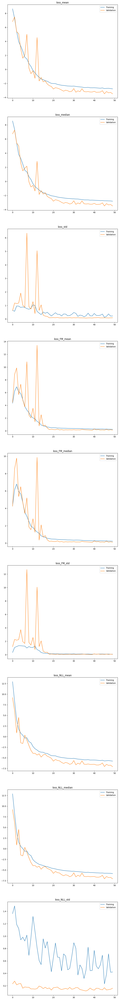

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [ ]:
trainer.test()

 24%|██▍       | 48/196 [00:12<00:37,  3.97it/s]

torch.Size([250000, 10])


100%|██████████| 196/196 [00:52<00:00,  3.73it/s]


{'loss_mean': -3.488365411758423,
 'loss_median': -3.4891622066497803,
 'loss_std': 0.08715062588453293,
 'loss_FM_mean': 0.12195479869842529,
 'loss_FM_median': 0.10301530361175537,
 'loss_FM_std': 0.05951903387904167,
 'loss_NLL_mean': -7.098685264587402,
 'loss_NLL_median': -7.097687721252441,
 'loss_NLL_std': 0.1466536968946457}

In [ ]:
#?ModelToPosteriorCNF

In [ ]:
N_SAMPLES_PER_MODEL = 1_000

In [ ]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model"
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM"
)


benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'alpha': 0.5}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_var =  (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()


                with pyro.plate("beta_plate", x.shape[1]):
                        beta = pyro.sample("beta", dist.Gamma(concentration=alpha, rate=1/beta_var))
                
                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                #print(f"beta: {beta.shape}")
                #print(f"x: {x.shape}")
                #print(f"mean: {mean.shape}")
                #print(f"sigma_squared: {sigma_squared.shape}")

                with pyro.plate("data", 

In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        full_model_no_FM,
                        vi_diag,
                        vi_multivariate_normal,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        hmc_sampler
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

torch.Size([250000, 10])
The save path /content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/PFN_Experiments_CFM_InvGammaGammPrior_FM_v2_StopGradients does not exist, creating it


In [ ]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:10<17:12, 10.43s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:21<17:14, 10.56s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:31<16:58, 10.50s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:41<16:45, 10.48s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:52<16:43, 10.56s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:03<16:27, 10.51s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:13<16:12, 10.46s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:23<16:00, 10.44s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:34<15:55, 10.50s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:44<15:41, 10.46s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:55<15:38, 10.54s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:05<15:23, 10.49s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:16<15:10, 10.47s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:26<14:58, 10.44s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:37<14:55, 10.54s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:47<14:40, 10.49s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:58<14:29, 10.48s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:09<14:26, 10.57s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:19<14:12, 10.53s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:30<14:01, 10.52s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:40<13:59, 10.62s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:51<13:45, 10.58s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:01<13:32, 10.55s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:12<13:27, 10.63s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:23<13:15, 10.61s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:33<13:05, 10.61s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:44<12:57, 10.65s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:55<12:42, 10.59s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:05<12:28, 10.55s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:16<12:21, 10.60s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:26<12:08, 10.55s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:37<11:56, 10.53s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:47<11:48, 10.58s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:58<11:34, 10.52s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:08<11:22, 10.50s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:19<11:10, 10.48s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:29<11:04, 10.55s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:40<10:53, 10.54s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:50<10:40, 10.50s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:01<10:32, 10.55s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:11<10:20, 10.52s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:22<10:08, 10.49s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:32<10:01, 10.56s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:43<09:49, 10.52s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:53<09:35, 10.46s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:04<09:29, 10.54s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:14<09:16, 10.50s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [08:25<09:05, 10.49s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [08:36<08:58, 10.55s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [08:46<08:45, 10.51s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:56<08:33, 10.48s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [09:07<08:25, 10.54s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [09:17<08:13, 10.49s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [09:28<08:01, 10.48s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [09:38<07:51, 10.48s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [09:49<07:43, 10.53s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [09:59<07:31, 10.49s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [10:10<07:23, 10.55s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [10:21<07:11, 10.52s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [10:31<06:59, 10.49s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [10:42<06:52, 10.58s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [10:52<06:40, 10.54s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [11:03<06:28, 10.49s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [11:13<06:16, 10.47s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [11:24<06:08, 10.52s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [11:34<05:56, 10.50s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [11:45<05:46, 10.51s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [11:55<05:37, 10.55s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [12:06<05:26, 10.52s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [12:16<05:15, 10.51s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [12:27<05:06, 10.59s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [12:37<04:55, 10.56s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [12:48<04:44, 10.53s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [12:59<04:34, 10.58s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [13:09<04:23, 10.53s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [13:20<04:14, 10.59s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [13:30<04:02, 10.53s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [13:41<03:50, 10.49s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [13:51<03:39, 10.48s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [14:02<03:30, 10.53s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [14:12<03:19, 10.49s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [14:22<03:08, 10.47s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [14:33<02:59, 10.53s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [14:44<02:47, 10.49s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [14:54<02:37, 10.49s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [15:05<02:27, 10.56s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [15:15<02:16, 10.54s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [15:26<02:06, 10.52s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [15:36<01:56, 10.58s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [15:47<01:45, 10.54s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [15:57<01:34, 10.51s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [16:08<01:23, 10.50s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [16:18<01:13, 10.56s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [16:29<01:03, 10.51s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [16:39<00:52, 10.48s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [16:50<00:42, 10.56s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [17:01<00:31, 10.54s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [17:11<00:21, 10.52s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [17:22<00:10, 10.58s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:12<20:21, 12.34s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:25<20:38, 12.64s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:37<20:24, 12.62s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:50<20:20, 12.72s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:03<20:05, 12.69s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:15<19:53, 12.69s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:28<19:42, 12.72s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:41<19:26, 12.68s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:53<19:11, 12.66s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:06<19:00, 12.68s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:19<18:47, 12.67s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:31<18:31, 12.63s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:44<18:21, 12.66s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:57<18:04, 12.61s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:09<17:46, 12.55s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:22<17:42, 12.65s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:35<17:28, 12.64s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:47<17:17, 12.65s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:00<17:13, 12.76s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:13<16:58, 12.73s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:26<16:44, 12.71s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:39<16:39, 12.82s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:51<16:23, 12.78s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:04<16:07, 12.73s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:17<15:59, 12.80s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:29<15:43, 12.74s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:42<15:29, 12.73s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:55<15:17, 12.75s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:08<15:00, 12.69s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:20<14:44, 12.64s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:33<14:42, 12.79s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:46<14:22, 12.68s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:58<14:04, 12.61s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:11<13:57, 12.69s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:24<13:44, 12.69s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:37<13:41, 12.84s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:49<13:23, 12.76s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:02<13:05, 12.67s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:15<12:52, 12.67s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:27<12:41, 12.69s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:40<12:30, 12.72s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [08:53<12:18, 12.74s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:05<12:03, 12.68s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:18<11:48, 12.65s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:31<11:41, 12.75s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [09:43<11:24, 12.68s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [09:56<11:14, 12.73s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:09<11:01, 12.73s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:22<10:47, 12.70s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:34<10:34, 12.68s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [10:47<10:21, 12.69s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [11:00<10:07, 12.65s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:12<09:50, 12.57s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:25<09:42, 12.65s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [11:37<09:28, 12.63s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [11:50<09:13, 12.59s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [12:03<09:03, 12.65s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:15<08:48, 12.57s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:28<08:34, 12.55s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [12:40<08:25, 12.65s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [12:53<08:11, 12.60s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [13:06<08:01, 12.68s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:18<07:47, 12.64s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [13:31<07:34, 12.61s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [13:44<07:24, 12.69s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [13:56<07:08, 12.61s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [14:09<06:55, 12.58s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:22<06:45, 12.68s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [14:34<06:32, 12.67s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [14:47<06:20, 12.67s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [15:00<06:08, 12.71s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [15:12<05:55, 12.69s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [15:25<05:41, 12.63s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [15:38<05:30, 12.69s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [15:50<05:16, 12.67s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [16:03<05:03, 12.65s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [16:16<04:51, 12.67s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [16:28<04:36, 12.58s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [16:41<04:24, 12.60s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [16:53<04:13, 12.65s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [17:06<03:59, 12.61s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:19<03:47, 12.66s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [17:31<03:34, 12.62s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [17:44<03:21, 12.58s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [17:57<03:10, 12.70s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [18:09<02:56, 12.61s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [18:22<02:44, 12.62s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [18:35<02:32, 12.69s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [18:47<02:18, 12.62s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [18:59<02:05, 12.55s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [19:12<01:53, 12.66s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [19:25<01:40, 12.62s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [19:37<01:28, 12.59s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [19:50<01:15, 12.66s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [20:03<01:03, 12.64s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [20:15<00:50, 12.62s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [20:28<00:37, 12.65s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [20:41<00:25, 12.60s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [20:53<00:12, 12.60s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<15:10,  9.20s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:18<15:03,  9.22s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:27<15:07,  9.36s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:37<14:53,  9.30s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:46<14:40,  9.27s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:55<14:39,  9.36s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:05<14:25,  9.30s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:14<14:11,  9.25s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:23<14:06,  9.31s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:32<13:55,  9.29s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:42<13:44,  9.27s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:51<13:34,  9.25s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:00<13:30,  9.32s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:10<13:18,  9.29s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:19<13:08,  9.28s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:28<13:04,  9.33s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:37<12:52,  9.30s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:47<12:41,  9.28s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [02:56<12:36,  9.34s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:05<12:23,  9.29s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:15<12:11,  9.26s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:24<12:00,  9.24s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:33<11:57,  9.31s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:42<11:44,  9.27s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [03:52<11:34,  9.26s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:01<11:29,  9.32s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:10<11:17,  9.28s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:19<11:05,  9.25s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:29<11:01,  9.32s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:38<10:49,  9.29s/it]

....................


Sampling posterior:  31%|███       | 31/100 [04:47<10:40,  9.28s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [04:57<10:28,  9.25s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:06<10:23,  9.31s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:15<10:11,  9.26s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:24<10:00,  9.23s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:34<09:54,  9.29s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [05:43<09:42,  9.25s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [05:52<09:32,  9.24s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:01<09:22,  9.22s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:11<09:16,  9.28s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:20<09:06,  9.26s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:29<08:54,  9.22s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [06:39<08:49,  9.29s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [06:48<08:37,  9.25s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [06:57<08:28,  9.24s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:06<08:23,  9.33s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:16<08:13,  9.30s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:25<08:04,  9.31s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [07:34<07:54,  9.30s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [07:44<07:47,  9.34s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [07:53<07:36,  9.31s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:02<07:24,  9.26s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:12<07:18,  9.33s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:21<07:07,  9.30s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [08:30<06:57,  9.28s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [08:40<06:50,  9.34s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [08:49<06:39,  9.29s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [08:58<06:29,  9.28s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:07<06:19,  9.25s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:17<06:12,  9.32s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [09:26<06:01,  9.28s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [09:35<05:51,  9.24s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [09:45<05:45,  9.34s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [09:54<05:34,  9.29s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [10:03<05:25,  9.29s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:12<05:15,  9.29s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [10:22<05:08,  9.35s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [10:31<04:57,  9.29s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [10:40<04:47,  9.28s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [10:50<04:40,  9.34s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [10:59<04:29,  9.30s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [11:08<04:19,  9.28s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [11:18<04:11,  9.33s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [11:27<04:02,  9.31s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [11:36<03:51,  9.28s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [11:45<03:42,  9.25s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [11:55<03:34,  9.32s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [12:04<03:24,  9.29s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [12:13<03:14,  9.28s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [12:23<03:06,  9.35s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [12:32<02:56,  9.31s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [12:41<02:46,  9.27s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [12:51<02:38,  9.34s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [13:00<02:28,  9.30s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [13:09<02:19,  9.27s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [13:18<02:09,  9.24s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [13:28<02:01,  9.32s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [13:37<01:51,  9.28s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [13:46<01:41,  9.25s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [13:56<01:33,  9.33s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [14:05<01:23,  9.31s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [14:14<01:14,  9.27s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [14:23<01:04,  9.26s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [14:33<00:56,  9.36s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [14:42<00:46,  9.35s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [14:51<00:37,  9.32s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [15:01<00:28,  9.37s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [15:10<00:18,  9.35s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [15:19<00:09,  9.30s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:14<23:33, 14.28s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:28<23:09, 14.17s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:42<23:04, 14.28s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:57<22:54, 14.31s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:11<22:52, 14.45s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:25<22:26, 14.33s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:39<22:03, 14.23s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:54<21:47, 14.22s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:08<21:25, 14.13s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:22<21:14, 14.16s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:36<20:55, 14.11s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:50<20:36, 14.05s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:04<20:24, 14.07s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:18<20:03, 14.00s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:32<19:53, 14.05s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:46<19:36, 14.01s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:00<19:26, 14.05s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:14<19:10, 14.03s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:28<18:54, 14.00s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:42<18:49, 14.12s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:56<18:31, 14.07s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:11<18:23, 14.15s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:24<18:05, 14.09s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:39<17:54, 14.13s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:53<17:38, 14.12s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:07<17:27, 14.16s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:21<17:08, 14.09s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:35<16:53, 14.07s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:49<16:44, 14.15s/it]

....................


Sampling posterior:  30%|███       | 30/100 [07:03<16:26, 14.09s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:18<16:16, 14.15s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:32<15:59, 14.11s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:46<15:50, 14.19s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [08:00<15:29, 14.09s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:14<15:12, 14.04s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:28<15:02, 14.11s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:42<14:48, 14.10s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:56<14:36, 14.14s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [09:10<14:19, 14.09s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:25<14:09, 14.15s/it]

....................


Sampling posterior:  41%|████      | 41/100 [09:39<13:52, 14.11s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:53<13:36, 14.08s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [10:07<13:23, 14.09s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:21<13:05, 14.03s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [10:35<12:54, 14.08s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [10:49<12:37, 14.03s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [11:03<12:20, 13.98s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:17<12:08, 14.02s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [11:31<11:53, 13.99s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [11:45<11:42, 14.06s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [11:59<11:27, 14.03s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [12:13<11:15, 14.08s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [12:27<10:59, 14.04s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [12:41<10:47, 14.07s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [12:55<10:31, 14.03s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [13:09<10:19, 14.08s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [13:23<10:02, 14.01s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [13:37<09:46, 13.97s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [13:51<09:35, 14.04s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [14:05<09:20, 14.01s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [14:19<09:08, 14.07s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [14:33<08:52, 14.01s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [14:47<08:37, 13.98s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [15:01<08:25, 14.05s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [15:15<08:10, 14.02s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [15:29<07:58, 14.08s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [15:43<07:42, 14.03s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [15:58<07:31, 14.10s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [16:12<07:16, 14.07s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [16:26<07:03, 14.10s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [16:40<06:47, 14.06s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [16:54<06:32, 14.02s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [17:08<06:20, 14.08s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [17:22<06:05, 14.04s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [17:36<05:52, 14.12s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [17:50<05:37, 14.06s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [18:04<05:22, 14.04s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [18:18<05:09, 14.08s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [18:32<04:54, 14.03s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [18:47<04:43, 14.17s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [19:01<04:28, 14.12s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [19:15<04:14, 14.15s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [19:29<03:59, 14.08s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [19:43<03:46, 14.13s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [19:57<03:31, 14.08s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [20:11<03:16, 14.07s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [20:25<03:03, 14.12s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [20:39<02:48, 14.07s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [20:54<02:35, 14.15s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [21:08<02:20, 14.09s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [21:22<02:07, 14.13s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [21:36<01:52, 14.12s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [21:50<01:38, 14.09s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [22:04<01:25, 14.19s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [22:18<01:10, 14.11s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [22:32<00:56, 14.16s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [22:46<00:42, 14.12s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [23:01<00:28, 14.21s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [23:15<00:14, 14.19s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:16<27:21, 16.58s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:33<27:00, 16.54s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:49<26:25, 16.34s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:05<26:12, 16.38s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:21<25:46, 16.28s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:38<25:33, 16.32s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:54<25:19, 16.33s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:11<25:10, 16.41s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:27<24:48, 16.36s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:44<24:42, 16.47s/it]

....................


Sampling posterior:  11%|█         | 11/100 [03:00<24:19, 16.40s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:16<24:10, 16.48s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:33<23:48, 16.41s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:49<23:32, 16.42s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [04:05<23:08, 16.34s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:22<22:51, 16.33s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:38<22:29, 16.26s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:54<22:21, 16.36s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [05:10<21:58, 16.28s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:27<21:55, 16.44s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:44<21:39, 16.44s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [06:00<21:28, 16.52s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [06:16<21:03, 16.41s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:33<20:46, 16.41s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:49<20:29, 16.39s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [07:06<20:20, 16.49s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:22<20:04, 16.49s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:39<19:52, 16.56s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:56<19:32, 16.51s/it]

....................


Sampling posterior:  30%|███       | 30/100 [08:12<19:14, 16.50s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:28<18:53, 16.43s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [08:45<18:36, 16.43s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [09:01<18:17, 16.38s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [09:17<18:02, 16.40s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:34<17:49, 16.46s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [09:51<17:34, 16.48s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [10:07<17:18, 16.48s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [10:24<17:05, 16.54s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [10:40<16:50, 16.56s/it]

....................


Sampling posterior:  40%|████      | 40/100 [10:57<16:33, 16.55s/it]

....................


Sampling posterior:  41%|████      | 41/100 [11:14<16:21, 16.64s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [11:30<16:02, 16.59s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [11:47<15:46, 16.61s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [12:03<15:30, 16.61s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [12:20<15:13, 16.62s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [12:36<14:53, 16.55s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [12:53<14:35, 16.51s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [13:10<14:21, 16.58s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [13:26<14:04, 16.55s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [13:42<13:43, 16.46s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [13:59<13:33, 16.60s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [14:15<13:09, 16.45s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [14:32<12:53, 16.45s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [14:48<12:35, 16.42s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [15:05<12:21, 16.47s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [15:21<12:02, 16.42s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [15:38<11:47, 16.46s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [15:54<11:30, 16.45s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [16:11<11:14, 16.45s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [16:27<10:58, 16.46s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [16:44<10:45, 16.55s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [17:00<10:25, 16.47s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [17:16<10:08, 16.44s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [17:33<09:48, 16.36s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [17:50<09:38, 16.53s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [18:06<09:19, 16.46s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [18:22<09:04, 16.49s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [18:39<08:47, 16.48s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [18:55<08:30, 16.47s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [19:12<08:13, 16.45s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [19:28<07:58, 16.50s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [19:45<07:42, 16.52s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [20:01<07:26, 16.54s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [20:18<07:08, 16.47s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [20:34<06:52, 16.52s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [20:51<06:36, 16.51s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [21:07<06:17, 16.42s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [21:24<06:03, 16.52s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [21:40<05:46, 16.50s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [21:57<05:30, 16.52s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [22:13<05:13, 16.52s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [22:30<04:58, 16.57s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [22:46<04:39, 16.43s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [23:03<04:22, 16.41s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [23:19<04:05, 16.39s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [23:36<03:50, 16.46s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [23:52<03:33, 16.41s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [24:09<03:18, 16.52s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [24:25<03:00, 16.44s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [24:41<02:44, 16.50s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [24:58<02:27, 16.43s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [25:14<02:11, 16.50s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [25:30<01:54, 16.36s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [25:47<01:38, 16.46s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [26:03<01:22, 16.41s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [26:20<01:05, 16.44s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [26:36<00:49, 16.47s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [26:53<00:33, 16.50s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [27:09<00:16, 16.48s/it]

....................


100%|██████████| 100/100 [00:00<00:00, 653.23it/s]


An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

100%|██████████| 100/100 [05:32<00:00,  3.33s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model,gt,18.652104,0.055561,0.53180,5.474552,0.121735,0.115038,0.003231,0.000056,0.037669,7.430351,0.057963,0.051291
1,full_model_no_FM,gt,18.646910,0.055581,0.52095,6.090070,0.121671,0.114147,0.003306,0.000057,0.032596,6.141025,0.050862,0.051673
2,Variational Inference with guide: AutoDiagonal...,gt,18.640502,0.055442,0.54310,-17.611627,0.173675,0.172927,0.002419,0.000032,0.033370,40.623757,0.149847,0.148221
3,Variational Inference with guide: AutoMultivar...,gt,18.633649,0.055325,0.53715,-6.907584,0.174458,0.177081,0.004190,0.000041,0.031255,34.323246,0.164729,0.165082
4,Variational Inference with guide: AutoLaplaceA...,gt,18.637255,0.055384,0.59130,NaN,NaN,0.114540,0.000000,0.000000,0.027940,NaN,NaN,0.054762
5,Variational Inference with guide: AutoIAFNorma...,gt,18.632802,0.055507,0.56920,-7.587835,0.262951,0.268823,0.064840,0.000276,0.031065,21.272969,0.203091,0.212533
6,Variational Inference with guide: AutoStructur...,gt,18.637268,0.055292,0.53270,-5.303747,0.183422,0.185065,0.003874,0.000039,0.032007,29.015577,0.160917,0.160101
7,Hamiltonian Monte Carlo,gt,18.652661,0.055428,0.51485,8.679407,0.112487,0.103191,0.002709,0.000038,0.034278,4.804128,0.066112,0.052571


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model,full_model_no_FM,4.391258e-14,3.082876e-02,2.241274e-02,6.685804e-02,9.397030e-01,3.938232e-01
1,full_model,Variational Inference with guide: AutoDiagonal...,3.896340e-18,6.701291e-18,3.575251e-02,1.234309e-15,1.129565e-03,4.078228e-06
2,full_model,Variational Inference with guide: AutoMultivar...,3.896560e-18,3.896120e-18,3.604327e-01,1.452787e-05,1.994473e-03,8.899585e-06
3,full_model,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,3.895461e-18,1.355743e-15,NaN,NaN,8.987678e-01
4,full_model,Variational Inference with guide: AutoIAFNorma...,7.559342e-17,3.212266e-03,2.562507e-10,5.430560e-12,1.772906e-13,6.818289e-15
5,full_model,Variational Inference with guide: AutoStructur...,4.266083e-18,3.896340e-18,9.346233e-01,3.374197e-05,2.113069e-03,5.946749e-06
6,full_model,Hamiltonian Monte Carlo,1.744198e-01,5.267730e-18,1.541645e-03,5.191258e-15,3.358217e-03,2.609999e-05
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,7.782675e-17,3.895241e-18,5.873131e-05,6.658387e-16,9.407610e-04,2.195164e-06
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,4.016156e-18,3.894582e-18,2.518891e-04,1.883689e-06,7.549543e-03,2.429682e-06
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,3.896340e-18,3.893044e-18,4.654316e-17,NaN,NaN,9.807981e-01



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,full_model,full_model_no_FM,0.276265,0.044963,0.581615,0.123630,0.062294,0.084378
1,full_model,Variational Inference with guide: AutoDiagonal...,0.671060,1.723733,0.979130,0.682475,1.209711,0.017240
2,full_model,Variational Inference with guide: AutoMultivar...,0.674394,1.243124,0.955550,0.742529,1.304050,0.035871
3,full_model,Variational Inference with guide: AutoLaplaceA...,0.524259,2.607633,1.000000,0.200372,0.434864,0.000000
4,full_model,Variational Inference with guide: AutoIAFNorma...,1.176378,1.999597,0.972725,1.111823,1.444698,0.031220
5,full_model,Variational Inference with guide: AutoStructur...,0.707085,1.375448,0.956920,0.715077,1.382531,0.033807
6,full_model,Hamiltonian Monte Carlo,0.348115,0.346349,0.915295,0.148024,0.304520,0.039234
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.664656,1.679310,0.976075,0.678518,1.203657,0.017726
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,0.660396,1.186220,0.949875,0.733480,1.300785,0.036175
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,0.515727,2.534993,1.000000,0.199905,0.432653,0.000000


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoDiagonal...,1.908938e-15,2.562144e-34,2.533579e-34
1,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoMultivar...,1.669232e-13,4.140465e-34,3.751618e-34
2,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoLaplaceA...,1.057906e-20,2.562144e-34,5.636699e-39
3,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoIAFNorma...,5.402133e-24,3.784563e-34,2.896584e-34
4,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoStructur...,2.356992e-14,4.808981e-34,3.147048e-34
...,...,...,...,...,...,...,...
163,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,2.008789e-08,4.645120e-03,2.629242e-31
164,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,2.785231e-01,4.913767e-14,1.816224e-34
165,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,2.423385e-01,1.762424e-01,2.308689e-03
166,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,9.879183e-05,6.860633e-04,9.075857e-01


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                         full_model  gt   
  1                                   full_model_no_FM  gt   
  2  Variational Inference with guide: AutoDiagonal...  gt   
  3  Variational Inference with guide: AutoMultivar...  gt   
  4  Variational Inference with guide: AutoLaplaceA...  gt   
  5  Variational Inference with guide: AutoIAFNorma...  gt   
  6  Variational Inference with guide: AutoStructur...  gt   
  7                            Hamiltonian Monte Carlo  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          18.652104            0.055561   
  1                                          18.646910            0.055581   
  2                                          18.640502            0.055442   
  3                                          18.633649            0.055325   
  4    

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

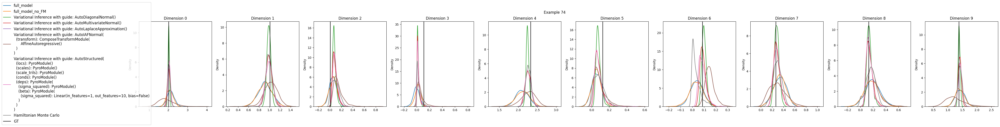

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

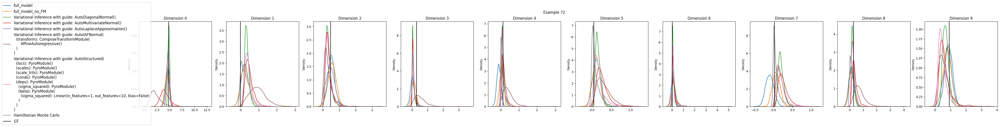

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

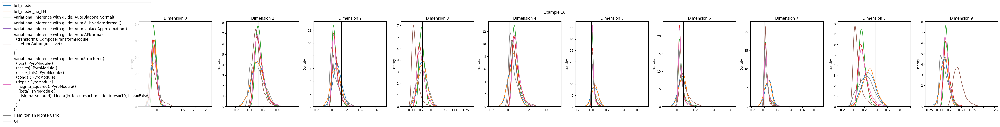

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

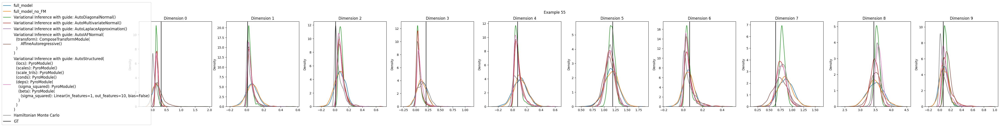

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

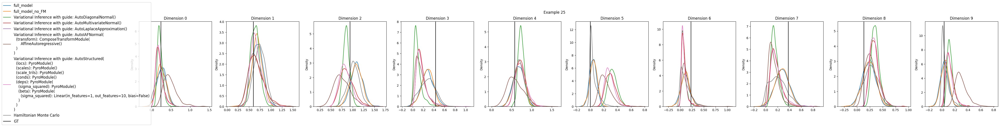

In [ ]:
evaluation.plot_results()